In [30]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.spatial as sp
import networkx as nx
from collections import Counter
import csv, time, os

15.7

In [31]:
def SaveData(data, filename):
    folder = 'Data'
    filePath = os.path.join(os.getcwd(), folder, filename)
    with open(filePath, 'w', newline='') as file:
        writer=csv.writer(file)
        writer.writerows(data)

def LoadData(filename):
    data = []
    folder = 'Data'
    filePath = os.path.join(os.getcwd(), folder, filename)
    with open(filePath, 'r') as file:
        for line in file:
            line = line.split(',')
            line = [float(i) for i in line]
            data.append(line)
    return data

def Initialization(n):
    if mode == 'Create':
        nodes = 10*np.random.uniform(0, 1, size=(n, 2))
        #nodes = np.random.rand(n, 2)
        connections = GenerateTopology(nodes)
        # Save data
        SaveData(nodes, 'nodes.csv')
        SaveData(connections, 'ConnectionMatrix.csv')
    else:
        # Load data
        nodes = LoadData('nodes.csv')
        connections = LoadData('ConnectionMatrix.csv')
    
    return nodes, connections

def GenerateTopology(points):
    n = len(points)
    # Define matrix
    connectionMatrix = np.zeros([n, n], dtype=float)
    # Find connections
    triangulation  = sp.Delaunay(points)
    # Reformat connections
    connections = []
    for simplex in triangulation.simplices:
        connections.extend([(simplex[i], simplex[(i + 1) % 3]) for i in range(3)])
    for connection in connections:
        i, j = connection
        connectionMatrix[i][j] = 1
        connectionMatrix[j][i] = 1
    # Ensure the diagonal is filled with zeros
    np.fill_diagonal(connectionMatrix, 0)
    return connectionMatrix

def DistanceMatrix(nodes, connections):
    '''
    Function to calculate distance and weight matrix
    '''
    n = len(nodes)
    # Define distance metrix and matrix
    Euclidian = lambda p1, p2: np.sqrt(((p1[0]-p2[0])**2) + ((p1[1]-p2[1])**2))
    dMatrix = np.zeros([n, n], dtype=float)
    weights = np.zeros([n, n], dtype=float)

    for i in range(n):
        for j in range(n):
            if connections[i][j] == 1:
                # Distance: Euclidian
                dMatrix[i][j] = dMatrix[j][i] = Euclidian(nodes[i], nodes[j])
                # Weight: 1/dij
                weights[i][j] = weights[j][i] = 1 / Euclidian(nodes[i], nodes[j])
    np.fill_diagonal(dMatrix, 0)
    np.fill_diagonal(weights, 0)
    return dMatrix, weights

def PathLength(path, dMatrix):
    distance = 0
    for i, currentNode in enumerate(path):
        if currentNode == path[-1]:
            break
        nextNode = path[i+1]
        distance += dMatrix[currentNode][nextNode]
    return distance

def TakeStep(nodes, connections, currentNode, weights, pheromoneLevels):
    probabilities = []
    n = len(connections)
    SingleProbability = lambda tao, w: (tao**alpha)*(w**beta)
    for i in range(n):
        probabilities.append(SingleProbability(pheromoneLevels[currentNode][i],weights[currentNode][i]))
    
    probabilities = [p/np.sum(probabilities) for p in probabilities]
    nextNode = np.random.choice(nodes, p=probabilities)
    return nextNode

def SimplifyPath(path):
    '''
    Can be improved!!
    '''
    visitedForward = [path[0]]
    visitedBackward = []
    for i in range(1, len(path)):
        visitedForward.append(path[i])
        visitedBackward.append(path[-i])
        if visitedBackward[-1] in visitedForward:
            idx = visitedForward.index(visitedBackward[-1])
            visitedForward = visitedForward[:idx]
            break
        elif visitedForward[-1] in visitedBackward:
            idx = visitedBackward.index(visitedForward[-1])
            visitedBackward = visitedBackward[:idx]
            break
    
    visitedBackward.reverse()
    simplifiedPath = visitedForward + visitedBackward
    return simplifiedPath

def UpdatePheromone(pheromoneLevels, paths, pDistance, end, connections):
    # Apply decay to all pheromone levels (1-p)*tao
    for i in range(len(pheromoneLevels)):
        for j in range(len(pheromoneLevels[0])):
            if connections[i][j] == 1:
                pheromoneLevels[i][j] *= (1-decay)
                if pheromoneLevels[i][j] < (1/(10**5)):
                    pheromoneLevels[i][j] = (1/(10**5))
    
    # Calculate added pheromone
    for i,path in enumerate(paths):
        edges = []
        if path[-1] == end:
            delta = Q/pDistance[i]
            for j in range(len(path)-1):
                edges.append([path[j], path[j+1]])
            for j in range(len(edges)):
                pheromoneLevels[edges[j][0]][edges[j][1]] += delta
            
    return pheromoneLevels

def PlotLength(r, sPathLength, mPathLength):
    rs = np.linspace(0, r, num=len(sPathLength))
    plt.subplot(1, 2, 1)
    plt.plot(rs, sPathLength, color='blue')
    plt.title('Shortest path length')
    plt.xlabel('Rounds')
    plt.ylabel('Length')
    plt.subplot(1, 2, 2)
    plt.title(f'Mean path length, n = {n}')
    plt.plot(rs, mPathLength, color='red')
    plt.xlabel('Rounds')
    plt.ylabel('Length')
    plt.show()

def PlotPath(nodes, path, start, end, step, dMatrix):
    print(f'Shortest path round {step}: {PathLength(path, dMatrix)}')
    ## Plot path ##
    x = [node[0] for node in nodes]
    y = [node[1] for node in nodes]
    xPath = [x[edge] for edge in path]
    yPath = [y[edge] for edge in path]
    plt.plot(xPath, yPath, linewidth=2, color='red')
    ## Plot all nodes and connections ##
    # Perform Delaunay triangulation
    triangulation = sp.Delaunay(nodes)
    # Create a graph from the Delaunay triangulation
    graph = nx.Graph()
    # Add nodes and edges to the graph
    for simplex in triangulation.simplices:
        graph.add_edge(simplex[0], simplex[1])
        graph.add_edge(simplex[1], simplex[2])
        graph.add_edge(simplex[2], simplex[0])
    # Draw the graph
    pos = {i: nodes[i] for i in range(len(nodes))}
    nx.draw_networkx(graph, pos, with_labels=True, font_weight='bold', node_size=200, node_color='skyblue', font_color='black', font_size=8)
    plt.title(f'Shortest path on round: {step}')

    plt.show()

def PlotPheromone(nodes, connections, pMatrix, step):
    n = len(nodes)
    # Modify connection lines based on pheromone levels
    x = [node[0] for node in nodes]
    y = [node[1] for node in nodes]

    for i in range(n):
        for j in range(n):
            if connections[i][j] == 1:
                pLevel = pMatrix[i][j] + pMatrix[j][i]
                color = 'black' if pLevel < (1/(10**5)) else 'orange'
                if step == 0:
                    linewidth = 2.5*pLevel
                else:
                    linewidth = 2*pLevel
                plt.plot([x[i], x[j]], [y[i], y[j]], color=color, linewidth=linewidth)

    ## Plot all nodes and connections ##
    # Perform Delaunay triangulation
    triangulation = sp.Delaunay(nodes)
    # Create a graph from the Delaunay triangulation
    graph = nx.Graph()
    # Add nodes and edges to the graph
    for simplex in triangulation.simplices:
        graph.add_edge(simplex[0], simplex[1])
        graph.add_edge(simplex[1], simplex[2])
        graph.add_edge(simplex[2], simplex[0])
    # Draw the graph
    pos = {i: nodes[i] for i in range(n)}
    nx.draw_networkx(graph, pos, with_labels=True, font_weight='bold', node_size=200, node_color='skyblue', font_color='black', font_size=8)
    plt.title(f'Pheromone levels on round: {step}')
    plt.show()

def RunAlgorithm(r, s, nAnts, n, savePoints, startPoint=-1, endPoint=-1):
    # Initialize grid and matrices
    nodes, connections = Initialization(n)
    dMatrix, weights = DistanceMatrix(nodes, connections)
    pMatrix = np.copy(connections) # Pheromone levels initialized to 1 where connections exist
    nodeList = np.linspace(0, n-1, num=n, dtype=int)

    # Set start and stop points:
    if startPoint == -1:
        start = np.random.randint(0, n-1)
    else:
        start = startPoint
    if endPoint == -1:
        end = np.random.randint(0, n-1)
        while start == end:
            end = np.random.randint(0, n-1)
    else:
        end = endPoint

    print(f'\n Start point: {start}\n End point: {end}')

    # Set up data save for later plotting
    sPath = []
    sPathLength = []
    mPathLength = []

    for round in range(r):
        # Generate ant paths, all at the same start point
        antPaths = [[start] for i in range(nAnts)]
        for step in range(s):
            for ant in range(nAnts):
                if antPaths[ant][-1] != end: # Only take step if end is not reached
                    antPaths[ant].append(TakeStep(nodeList, connections, antPaths[ant][-1], weights, pMatrix))
        
        # Simplify paths and calculate length of finished paths
        pLength = []
        fPaths = []
        for ant in range(nAnts):
            if antPaths[ant][-1] == end:
                fPaths.append(SimplifyPath(antPaths[ant])) # Save finished paths seperately
                pLength.append(PathLength(antPaths[ant], dMatrix))
        
        # Update pheromone levels, only finished paths influence
        pMatrix = UpdatePheromone(pMatrix, fPaths, pLength, end, connections)

        if round < 20:
            idx = np.argmin(pLength)
            sPathLength.append(np.copy(pLength[idx]))
            mPathLength.append(np.mean(pLength))
        elif round % 10 == 0 and round > 20:
            idx = np.argmin(pLength)
            sPathLength.append(np.copy(pLength[idx]))
            mPathLength.append(np.mean(pLength))

        if round in savePoints:
            idx = np.argmin(pLength)
            PlotPheromone(nodes, connections, pMatrix, round)
            PlotPath(nodes, fPaths[idx], start, end, round, dMatrix)
            sPath.append(fPaths[idx])
    PlotLength(r, sPathLength, mPathLength)
  


 Start point: 38
 End point: 7


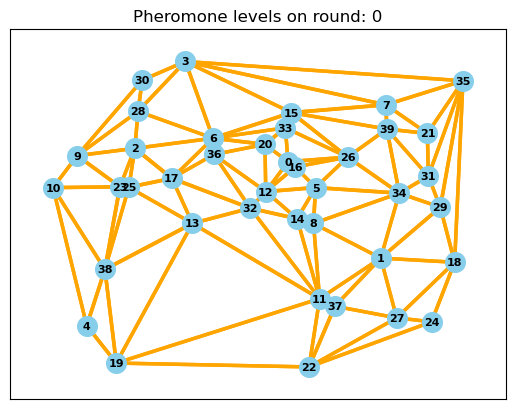

Shortest path round 0: 24.227204328057496


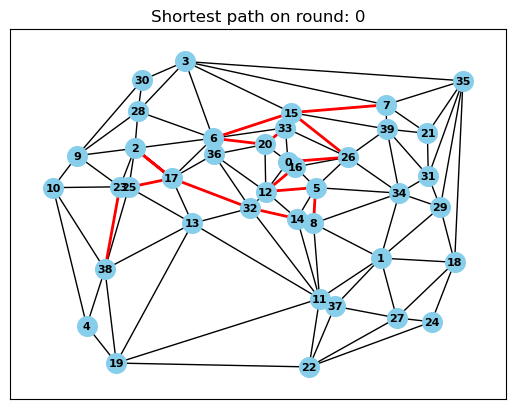

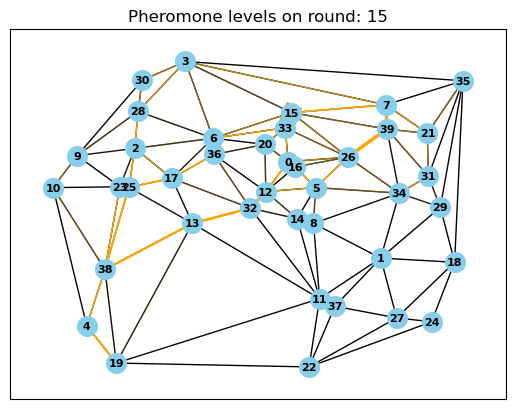

Shortest path round 15: 8.938610538863065


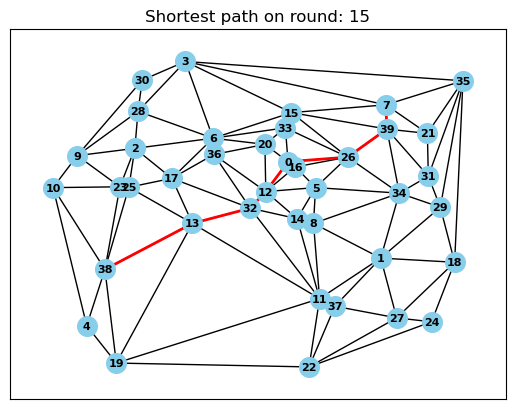

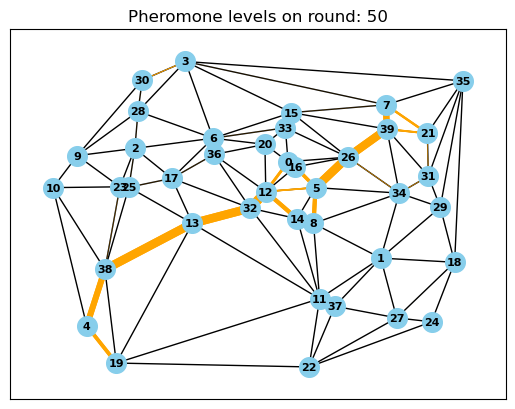

Shortest path round 50: 8.853545084364159


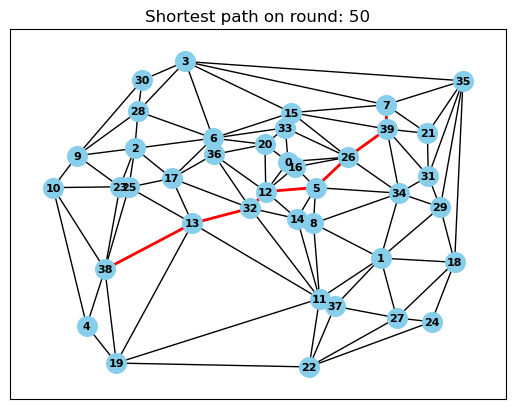

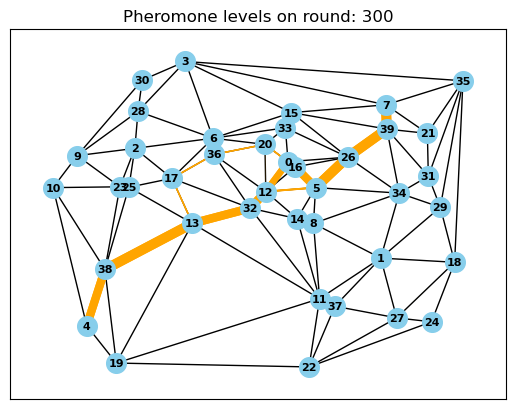

Shortest path round 300: 8.853545084364159


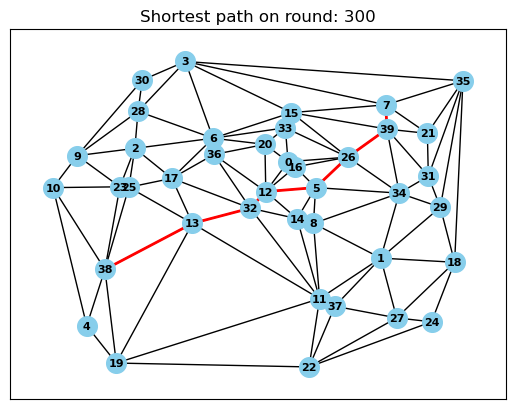

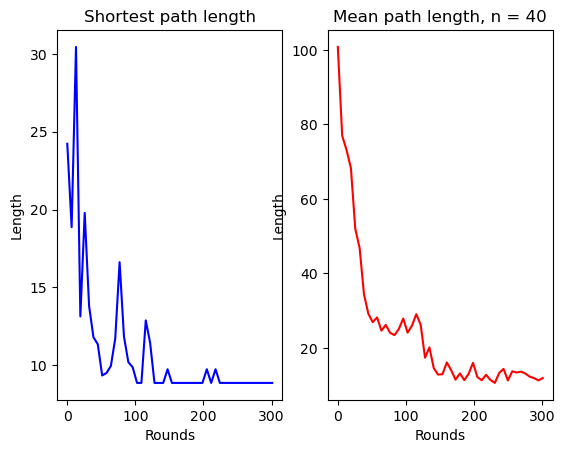

Simulation time:  0 minutes and 13 seconds


In [35]:
# Variables
mode = 'Load'
alpha = 0.8
beta = 1
decay = 0.5
R = 301
S = 120
nA = 20
Q = 1
n = 40
st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=38, endPoint=7)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

15.8 Part ( a )
n = [60, 120, 180]

It is clear from the simulations below that the program does not settle as well on a shortest path as in the previous exercise with increasing nodes and but it it is decreasing and the mean path length in particular seems to decrease steadily. With longer simulation time it should look similar to with fewer nodes as the ants choose a specific route, although not necessarily the shortest one but the one that happens to have the most pheromone. 

n = 60

In [36]:
def Initialization(n):
    if mode == 'Create':
        nodes = 10*np.random.uniform(0, 1, size=(n, 2))
        #nodes = np.random.rand(n, 2)
        connections = GenerateTopology(nodes)
        # Save data
        SaveData(nodes, 'nodes60.csv')
        SaveData(connections, 'ConnectionMatrix60.csv')
    else:
        # Load data
        nodes = LoadData('nodes60.csv')
        connections = LoadData('ConnectionMatrix60.csv')
    
    return nodes, connections


 Start point: 29
 End point: 44


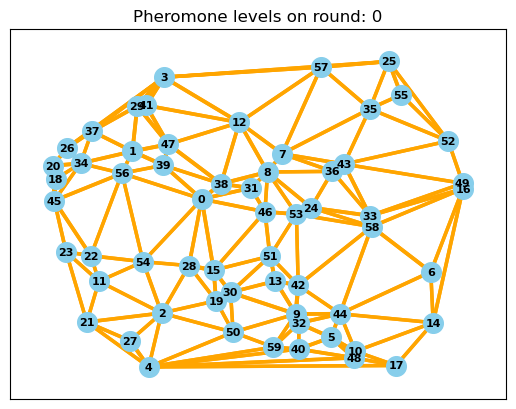

Shortest path round 0: 20.279895066644947


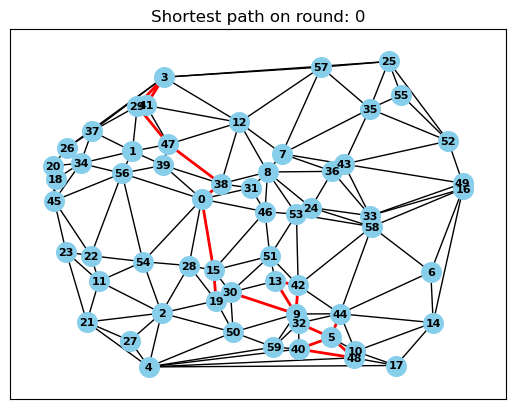

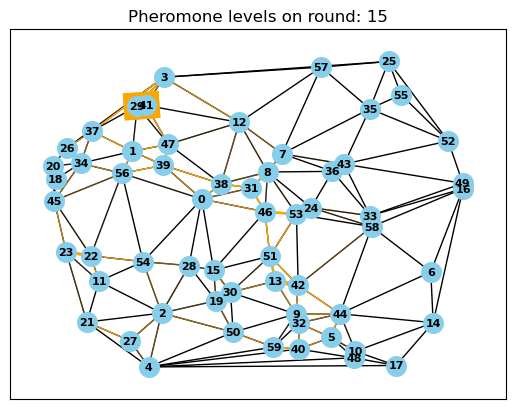

Shortest path round 15: 12.231952815297793


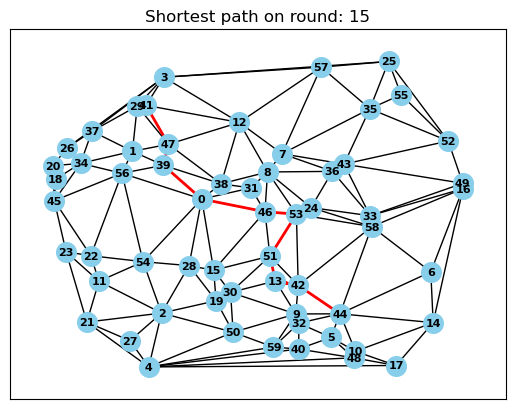

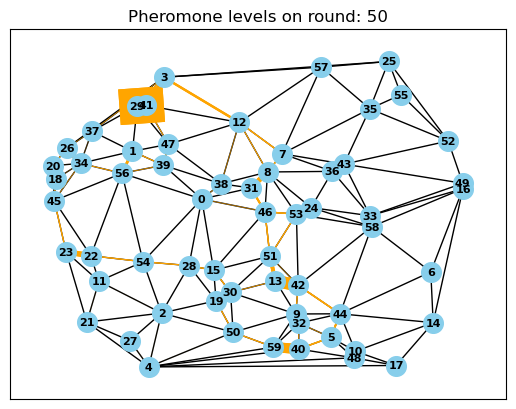

Shortest path round 50: 11.985462258956742


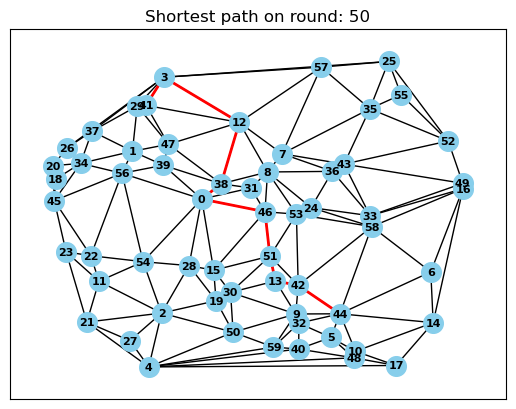

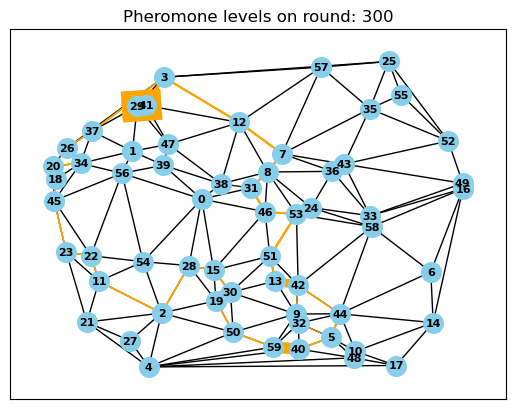

Shortest path round 300: 17.806259918693808


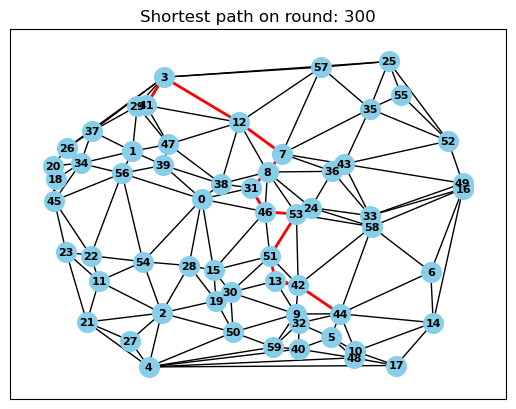

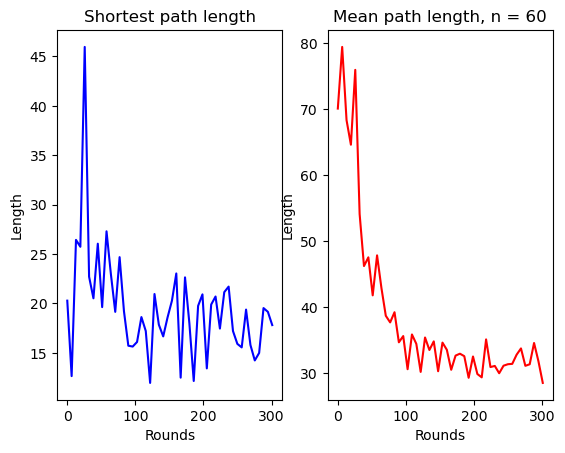

Simulation time:  1 minutes and 50 seconds


In [48]:
# Variables
mode = 'Load'
alpha = 0.8
beta = 1
decay = 0.5
R = 301
S = 120
nA = 20
Q = 1
n = 60
st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=29, endPoint=44)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

n = 120

In [49]:
def Initialization(n):
    if mode == 'Create':
        nodes = 10*np.random.uniform(0, 1, size=(n, 2))
        #nodes = np.random.rand(n, 2)
        connections = GenerateTopology(nodes)
        # Save data
        SaveData(nodes, 'nodes120.csv')
        SaveData(connections, 'ConnectionMatrix120.csv')
    else:
        # Load data
        nodes = LoadData('nodes120.csv')
        connections = LoadData('ConnectionMatrix120.csv')
    
    return nodes, connections


 Start point: 3
 End point: 72


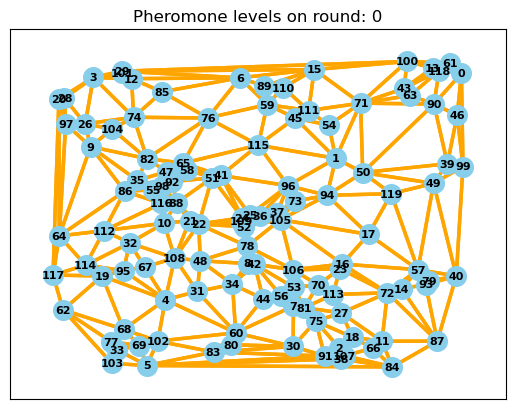

Shortest path round 0: 34.245897206985255


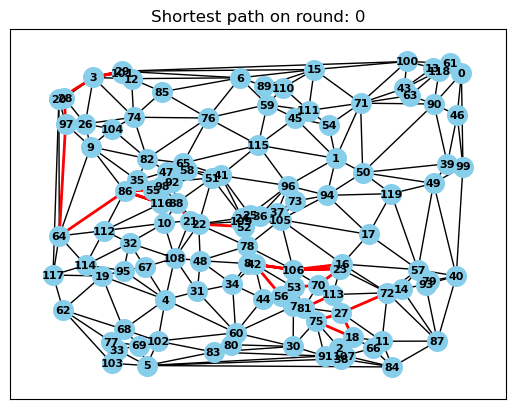

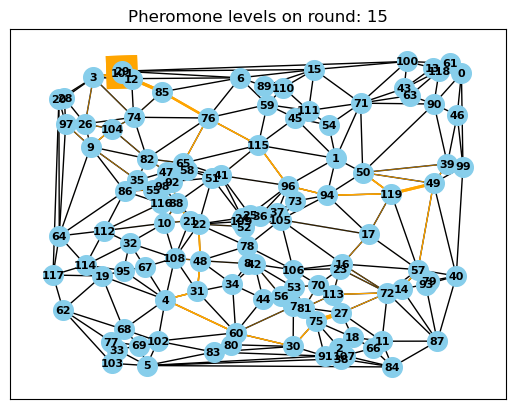

Shortest path round 15: 16.39388621478484


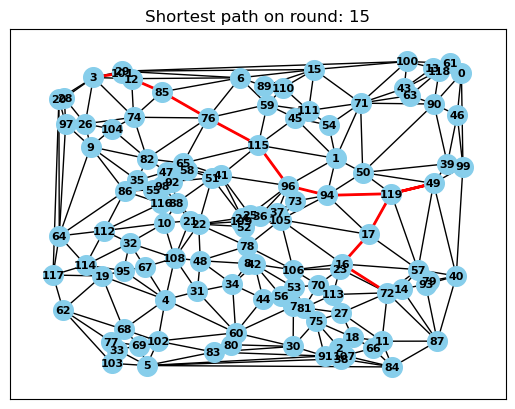

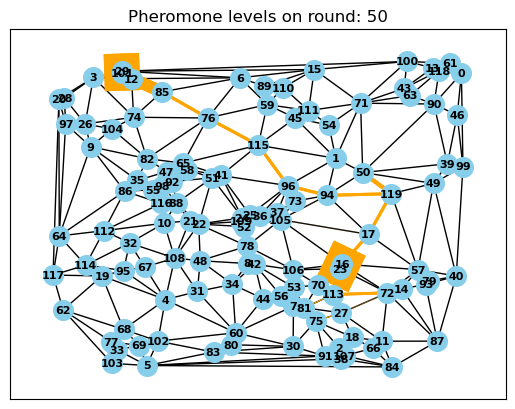

Shortest path round 50: 14.539156448940153


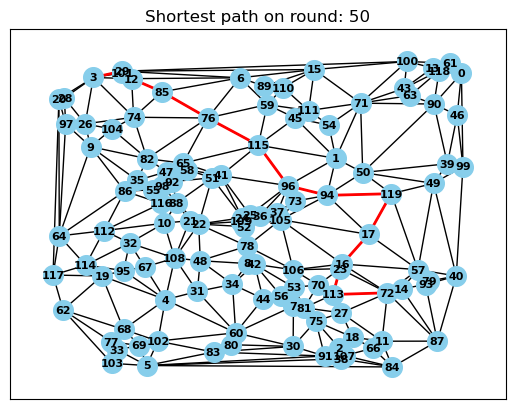

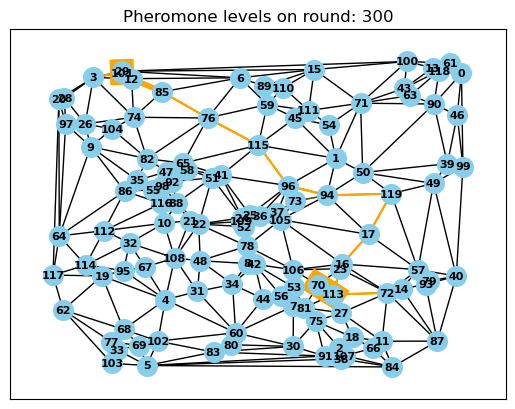

Shortest path round 300: 15.443850609263569


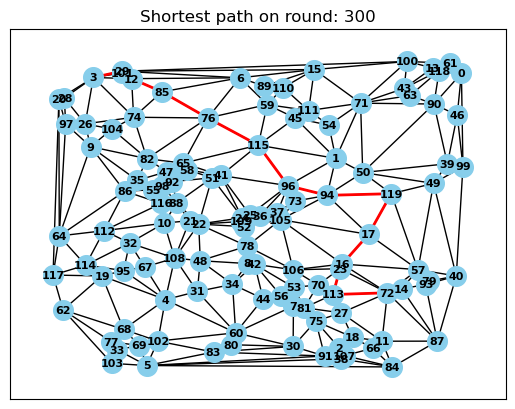

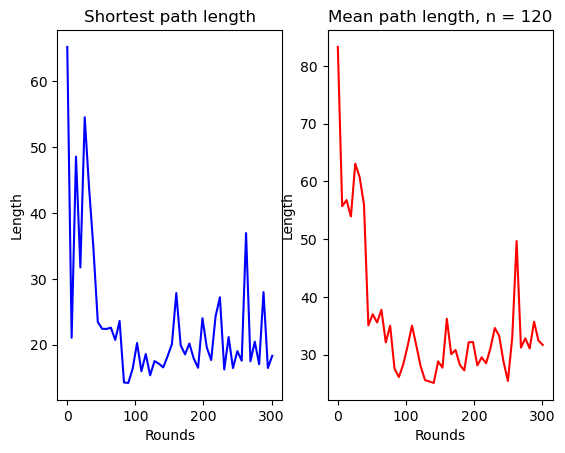

Simulation time:  6 minutes and 19 seconds


In [50]:
# Variables
mode = 'Load'
alpha = 0.8
beta = 1
decay = 0.5
R = 301
S = 120
nA = 20
Q = 1
n = 120
st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=3, endPoint=72)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

n = 180

In [51]:
def Initialization(n):
    if mode == 'Create':
        nodes = 10*np.random.uniform(0, 1, size=(n, 2))
        #nodes = np.random.rand(n, 2)
        connections = GenerateTopology(nodes)
        # Save data
        SaveData(nodes, 'nodes180.csv')
        SaveData(connections, 'ConnectionMatrix180.csv')
    else:
        # Load data
        nodes = LoadData('nodes180.csv')
        connections = LoadData('ConnectionMatrix180.csv')
    
    return nodes, connections


 Start point: 97
 End point: 6


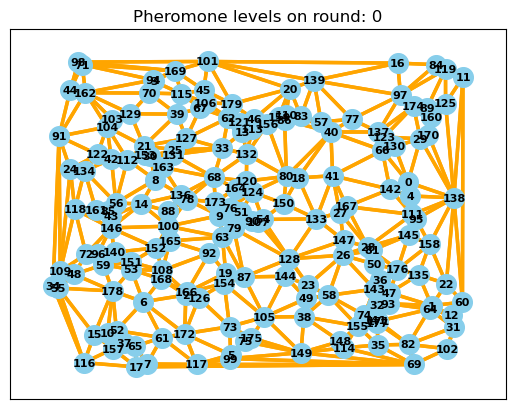

Shortest path round 0: 35.76835796267726


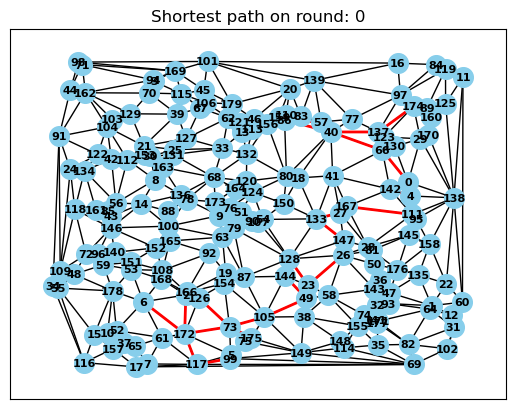

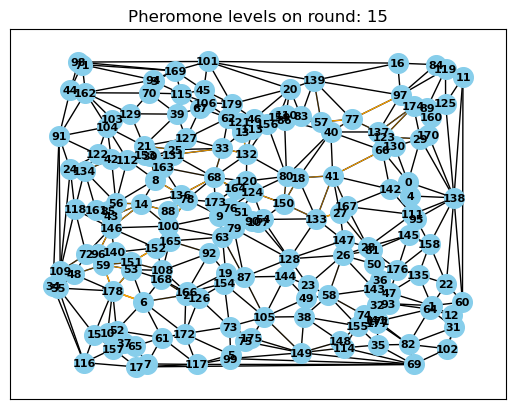

Shortest path round 15: 28.74294806452153


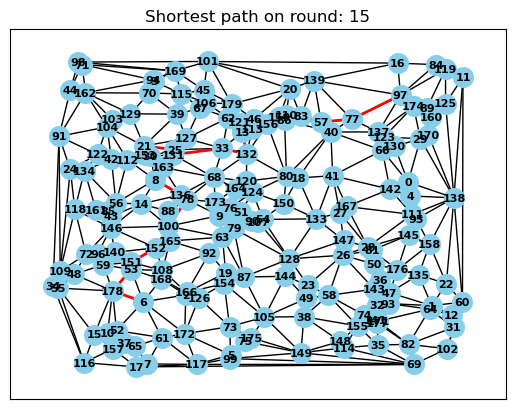

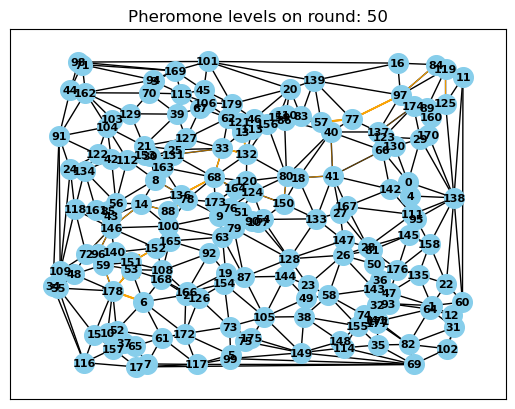

Shortest path round 50: 19.272527359757344


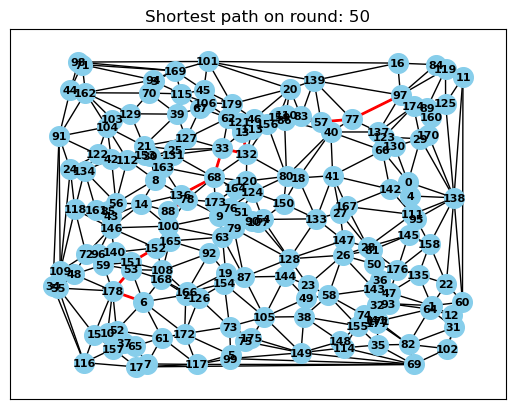

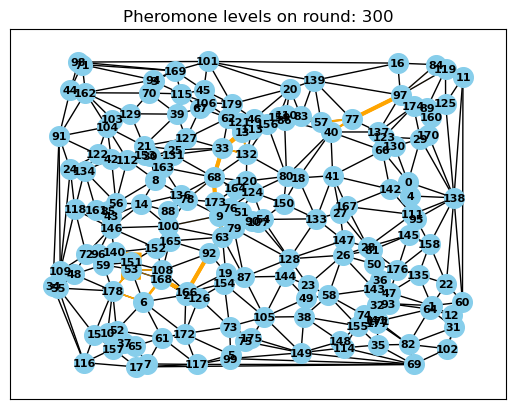

Shortest path round 300: 12.754886033806487


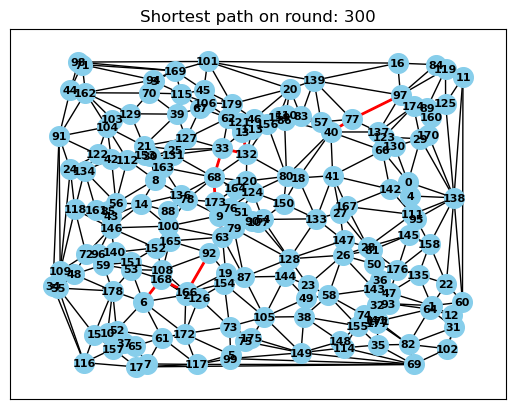

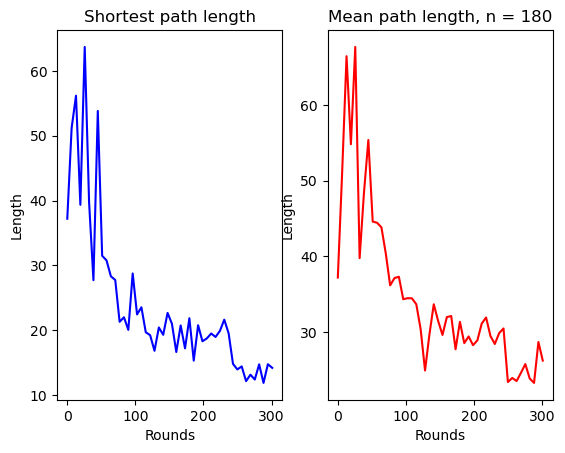

Simulation time: 11 minutes and  7 seconds


In [56]:
# Variables
mode = 'Load'
alpha = 0.8
beta = 1
decay = 0.5
R = 301
S = 120
nA = 20
Q = 1
n = 180
st = time.time()

RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=97, endPoint=6)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

b ) From the early pheromone matrix it is clear that the ants do not explore the entire grid, likely because of the S limit where they have to find the end before it is reached. The S limit is necessary to limit the computation time but limits the exploring of options. It is also clear that the first couple of found paths determine the final solution as taking alternative routes when the pheromone has started decaying is increasingly unlikely.

c) Varying alpha, beta and decay

In [57]:
def Initialization(n):
    if mode == 'Create':
        nodes = 10*np.random.uniform(0, 1, size=(n, 2))
        #nodes = np.random.rand(n, 2)
        connections = GenerateTopology(nodes)
        # Save data
        SaveData(nodes, 'nodes120c.csv')
        SaveData(connections, 'ConnectionMatrix120c.csv')
    else:
        # Load data
        nodes = LoadData('nodes120c.csv')
        connections = LoadData('ConnectionMatrix120c.csv')
    
    return nodes, connections


 Start point: 33
 End point: 38


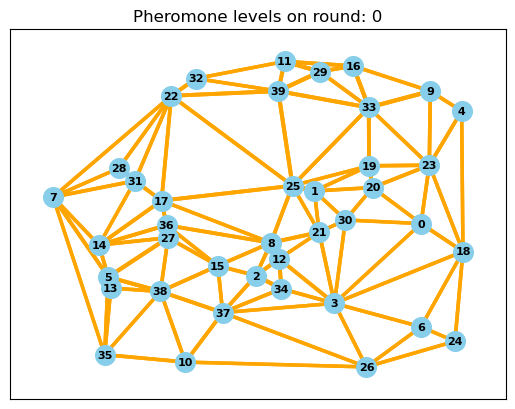

Shortest path round 0: 11.957853108584322


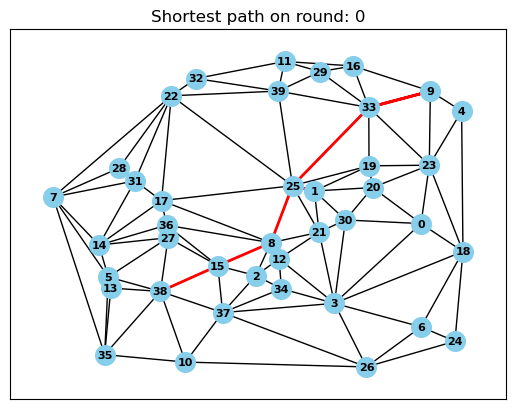

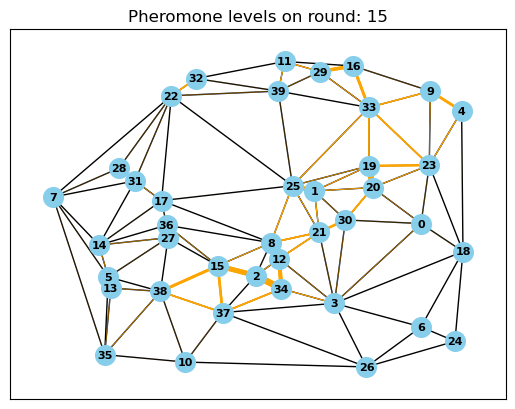

Shortest path round 15: 9.54761158389692


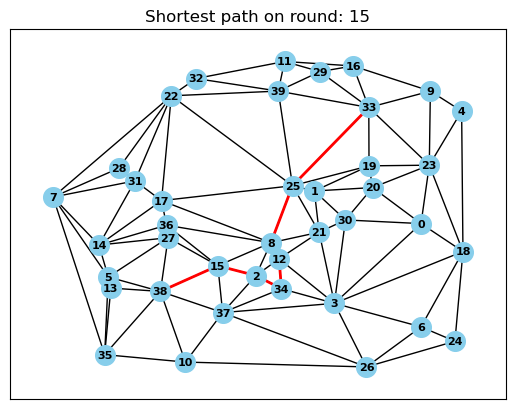

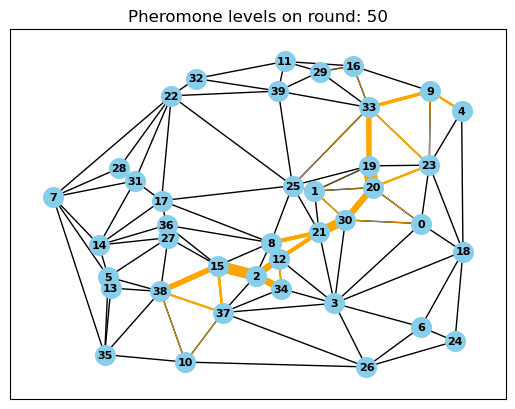

Shortest path round 50: 9.365755716418247


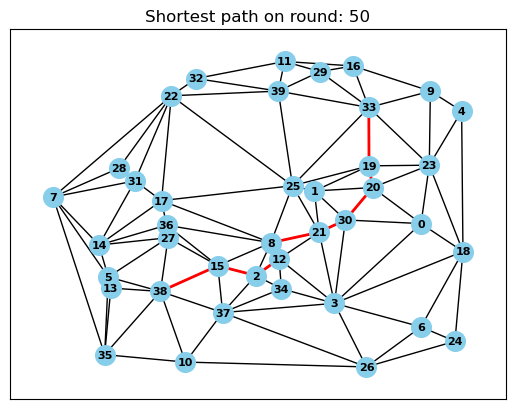

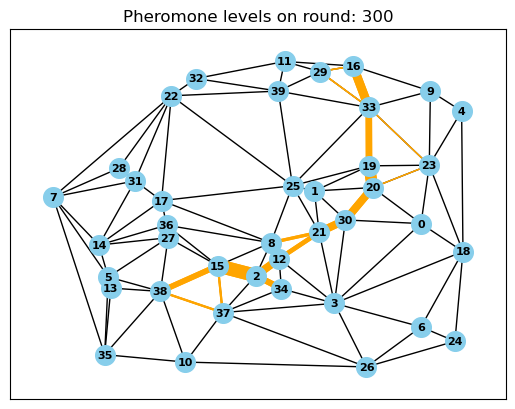

Shortest path round 300: 9.365755716418247


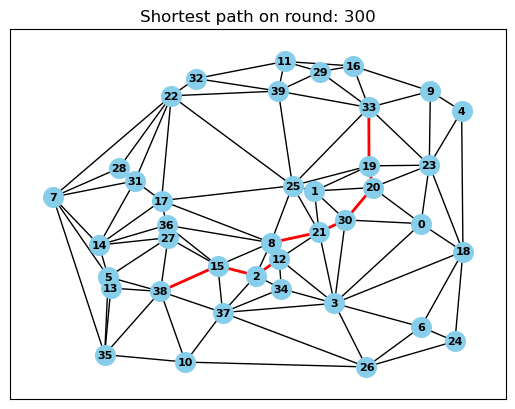

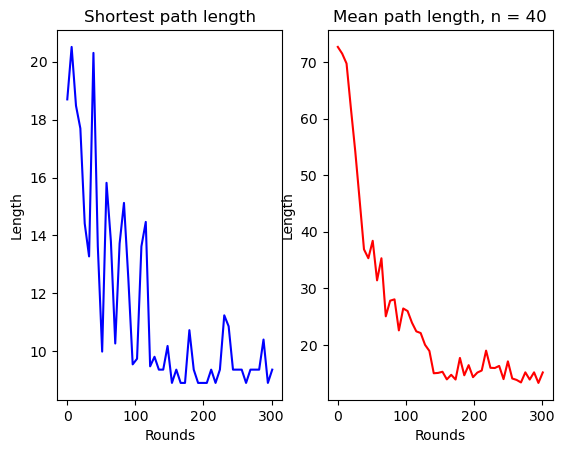

Simulation time:  0 minutes and 16 seconds


In [64]:
# Variables
mode = 'Load'
alpha = 0.8
beta = 1
decay = 0.5
R = 301
S = 120
nA = 20
Q = 1
n = 40
st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=33, endPoint=38)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')


 Start point: 33
 End point: 38


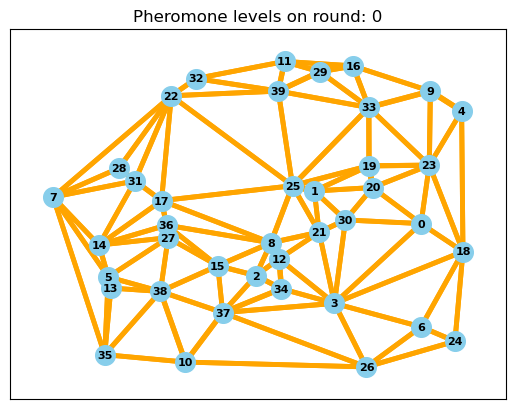

Shortest path round 0: 14.068174302949997


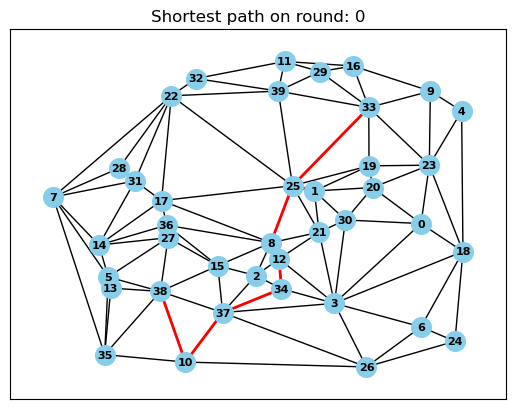

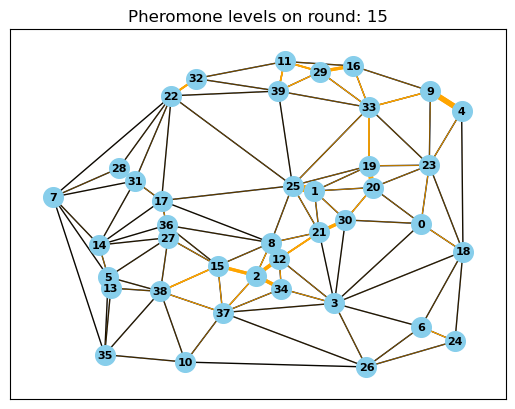

Shortest path round 15: 10.270443640676909


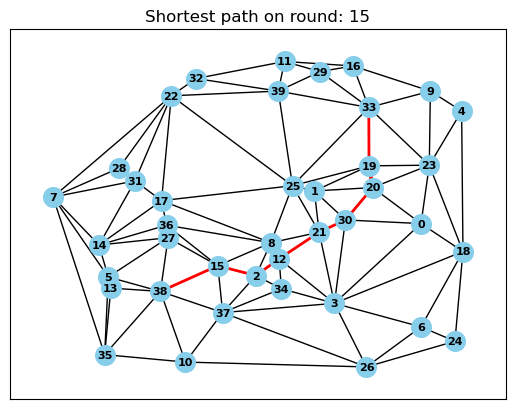

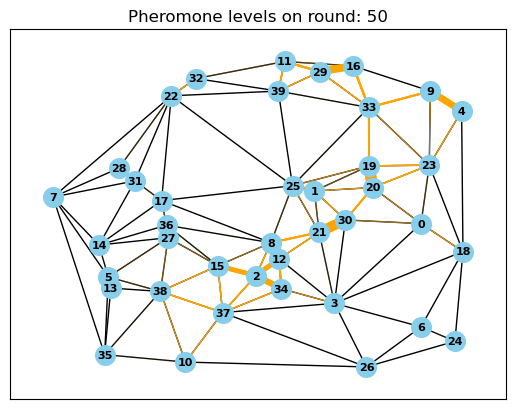

Shortest path round 50: 14.611737881804903


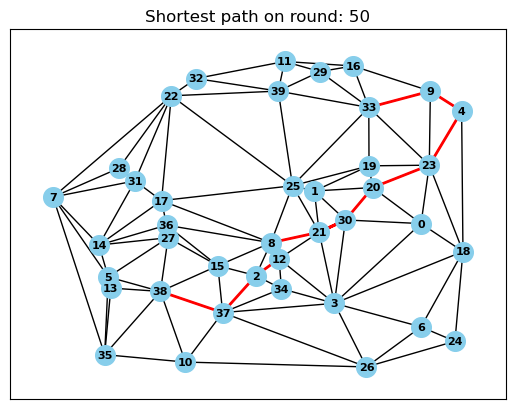

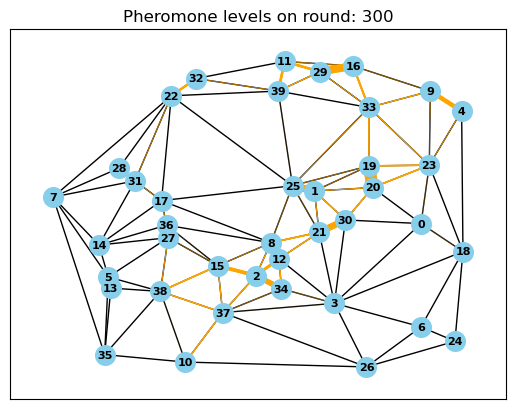

Shortest path round 300: 13.535424161630088


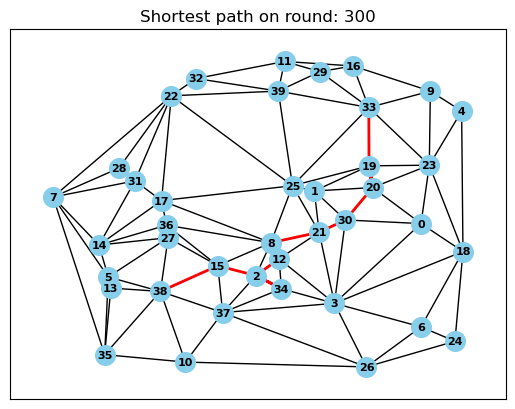

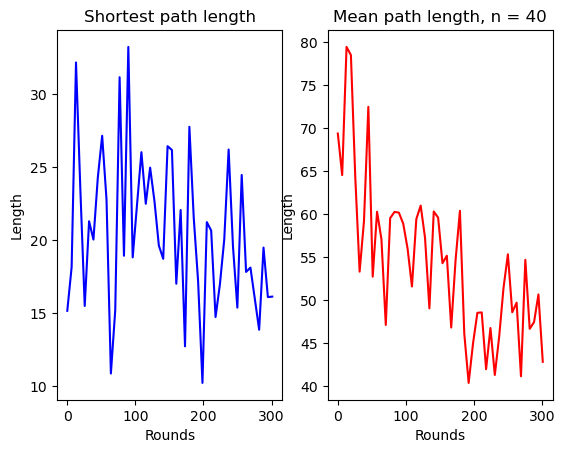

Simulation time:  1 minutes and  4 seconds


In [68]:
# Increased beta and decreased decay: Values weight (1/dij) more and explores longer
mode = 'Load'
alpha = 0.5
beta = 2
decay = 0.3
st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=33, endPoint=38)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

Very little stability, and a overall worse solution


 Start point: 33
 End point: 38


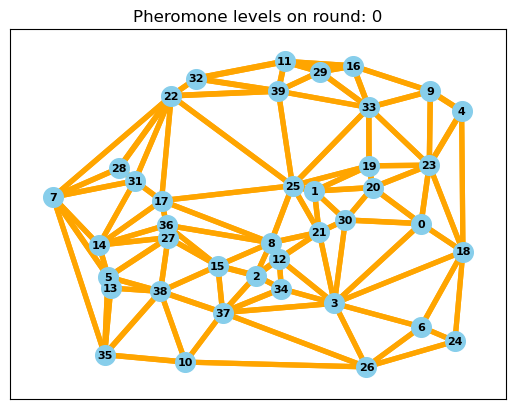

Shortest path round 0: 18.8583226615279


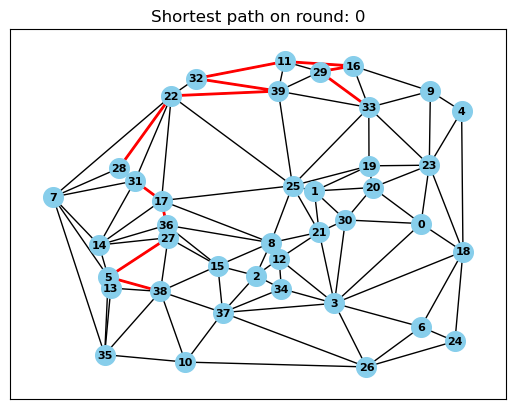

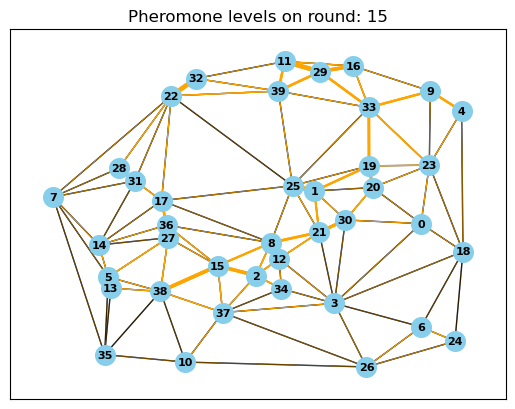

Shortest path round 15: 9.095993768363616


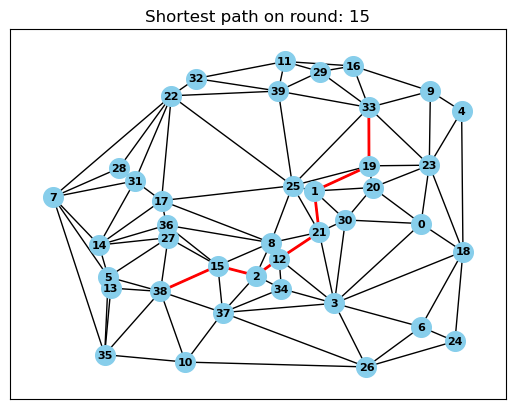

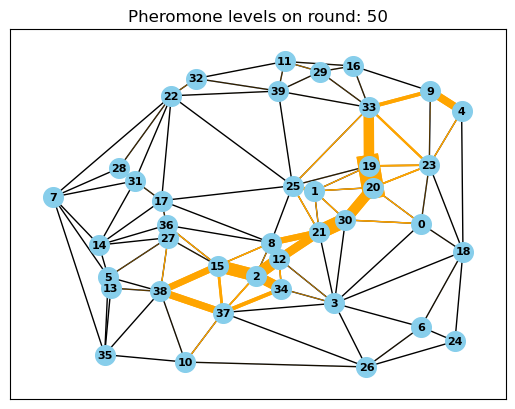

Shortest path round 50: 11.29802720915844


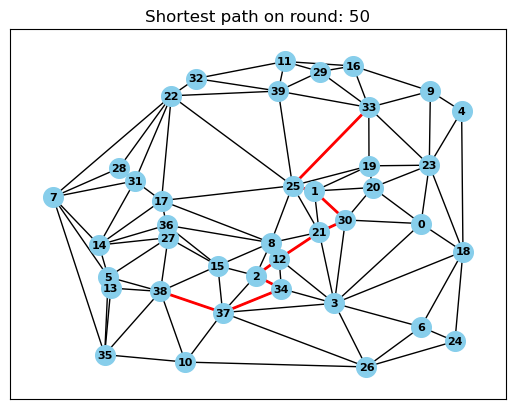

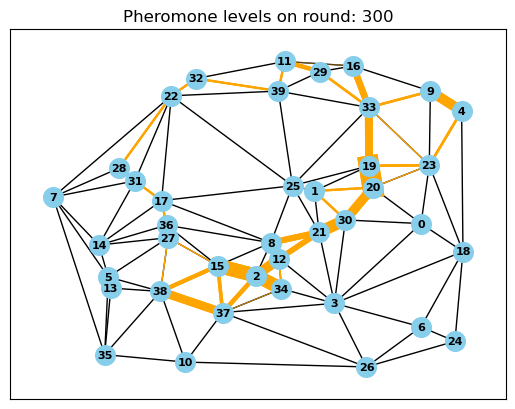

Shortest path round 300: 10.754720258303108


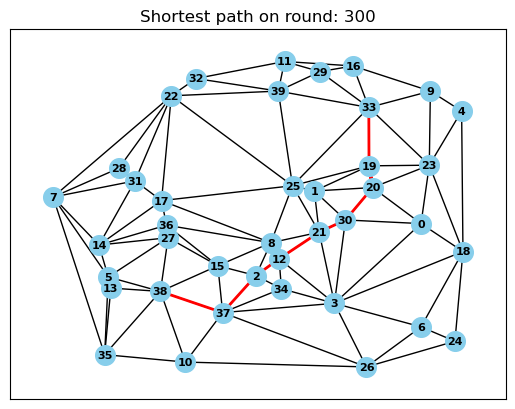

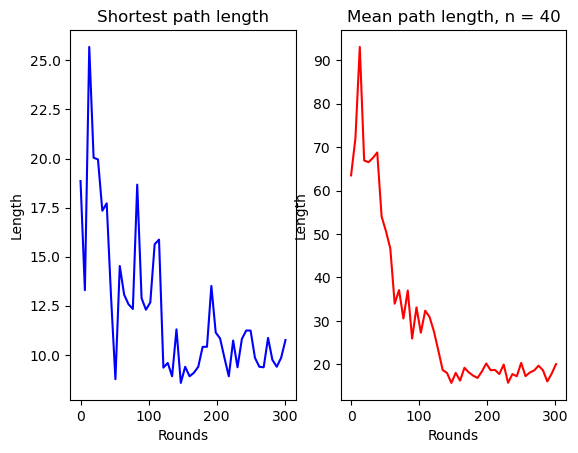

Simulation time:  0 minutes and 19 seconds


In [71]:
# Test to only reduce the decay factor
mode = 'Load'
alpha = 0.8
beta = 1
decay = 0.25
st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=33, endPoint=38)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

Explores larger parts of the map, but is not very stable. Looks like it settles after a while. Looking at the mean it decreases but is still not uniform with the shortest path because there are too many options around.


 Start point: 33
 End point: 38


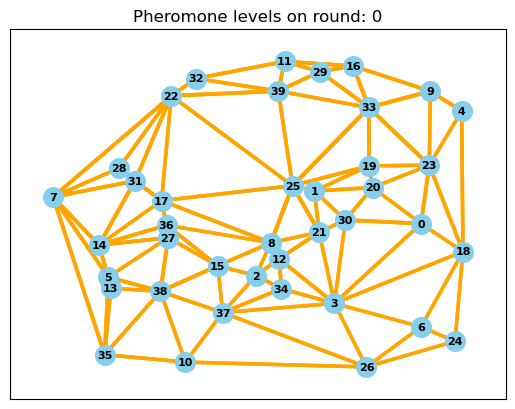

Shortest path round 0: 7.84764718869187


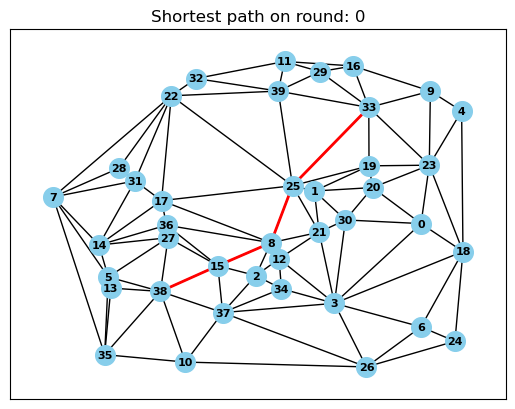

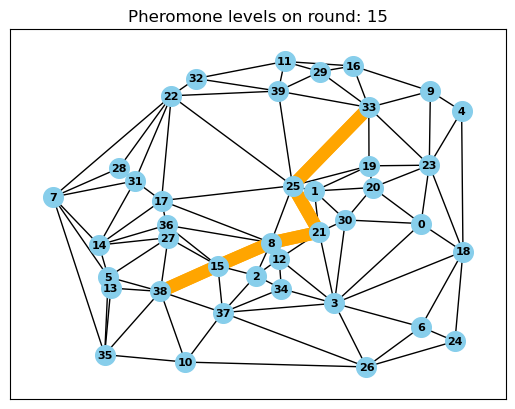

Shortest path round 15: 8.74707550002377


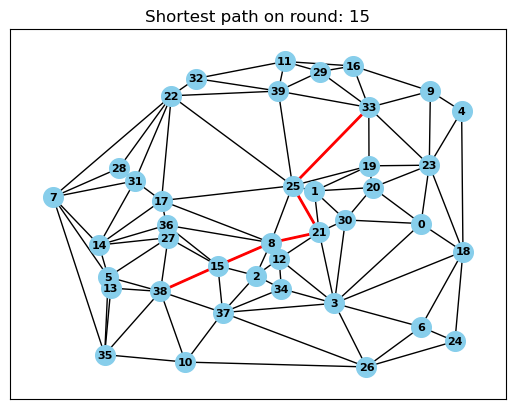

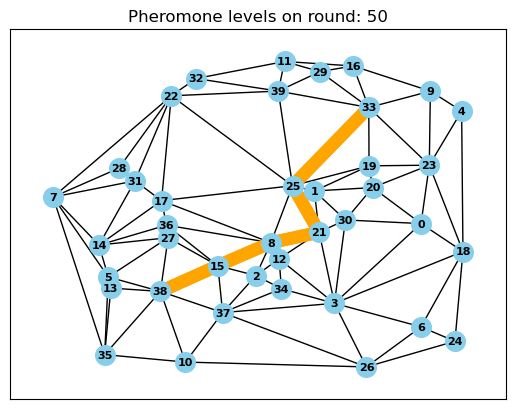

Shortest path round 50: 8.74707550002377


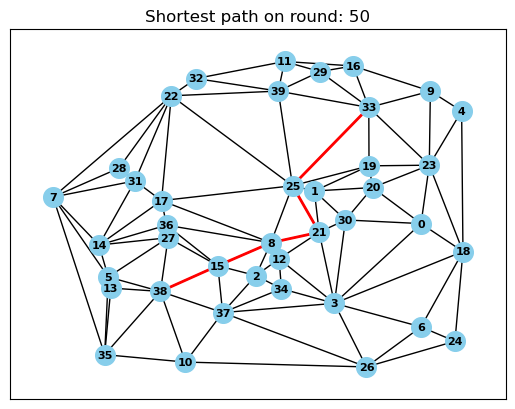

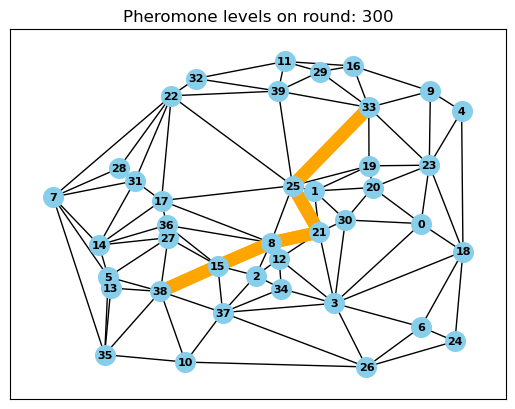

Shortest path round 300: 8.74707550002377


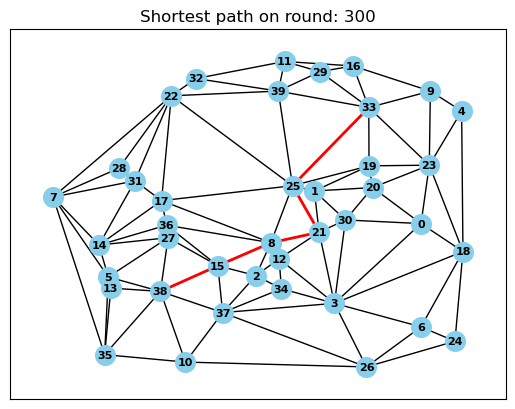

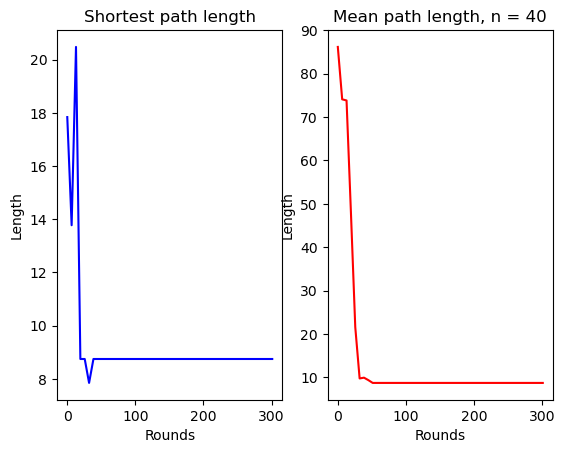

Simulation time:  0 minutes and  6 seconds


In [72]:
# Test increase alpha: Value pheromone levels more
mode = 'Load'
alpha = 2
beta = 0
decay = 0.5
st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=33, endPoint=38)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

Finds a path in the beginning that happens to be good. But since it only values pheromone a better path was discarded. No exploring and very stable as a result.


 Start point: 33
 End point: 38


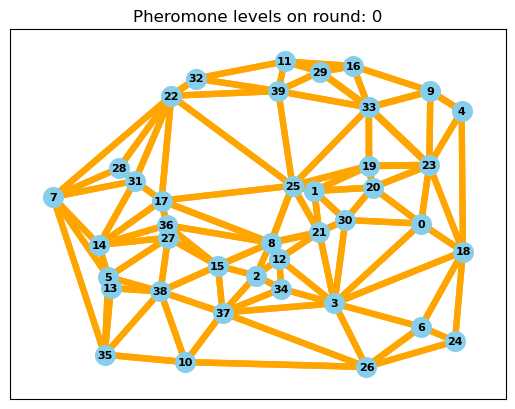

Shortest path round 0: 13.547932950186851


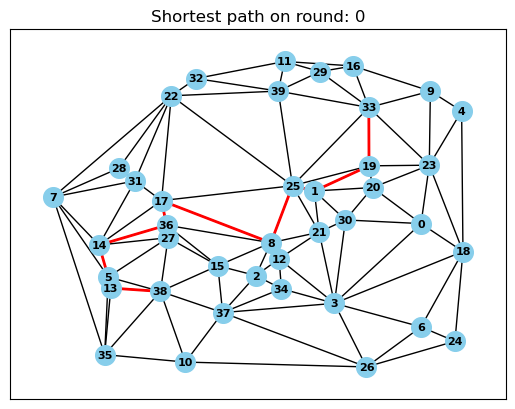

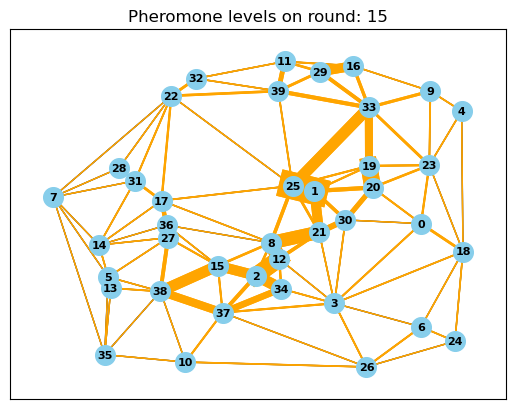

Shortest path round 15: 9.791593297391424


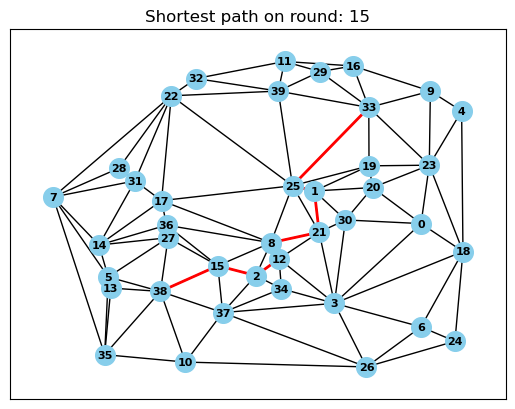

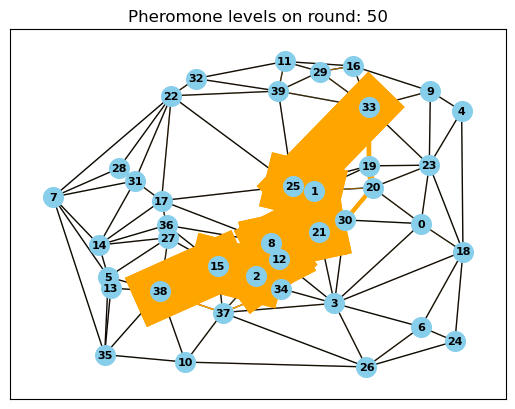

Shortest path round 50: 9.365755716418247


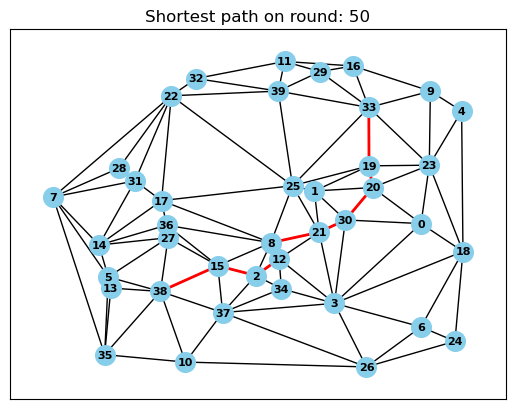

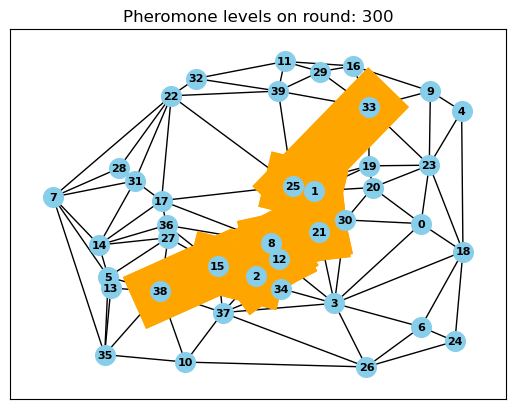

Shortest path round 300: 9.791593297391424


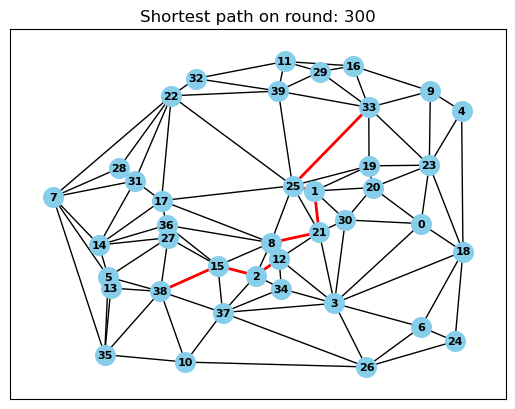

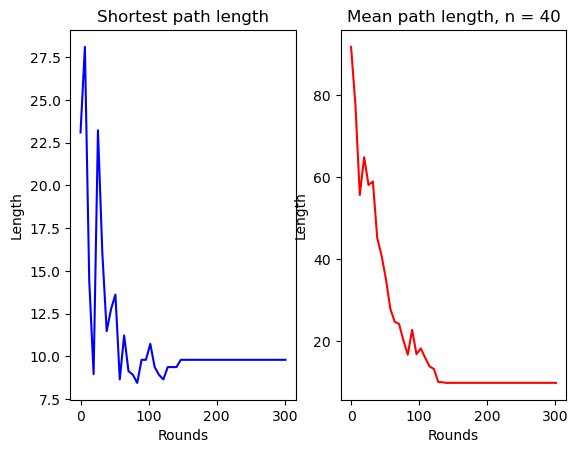

Simulation time:  0 minutes and  9 seconds


In [76]:
# Increased alpha, slightly decreased beta and slightly decreased decay: Will hopefully maintain some exploring
mode = 'Load'
alpha = 2
beta = 0.8
decay = 0.1
st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=33, endPoint=38)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

Not a very viable solution, depends a lot on the initially best solutions. Extended exploring phase.


 Start point: 33
 End point: 38


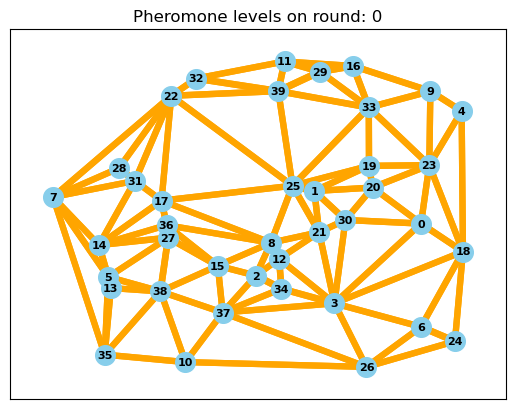

Shortest path round 0: 13.170638344407028


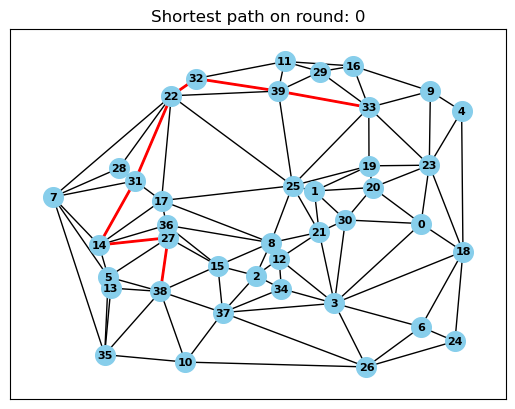

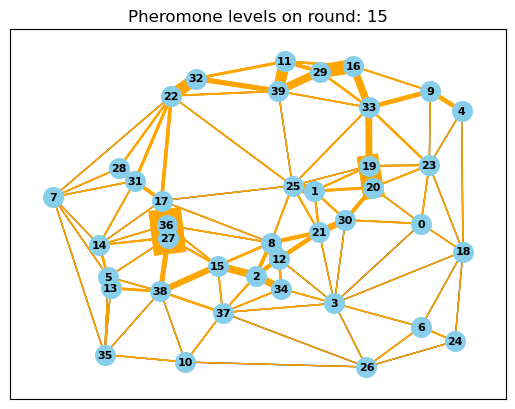

Shortest path round 15: 11.799982483842717


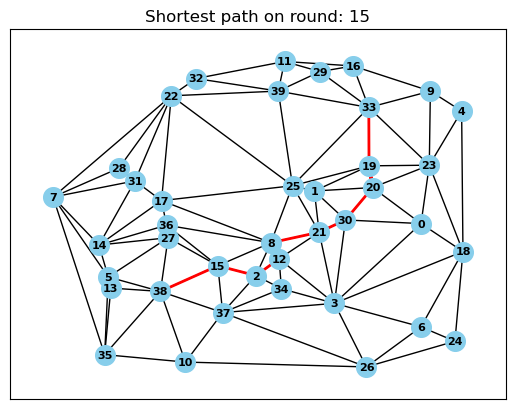

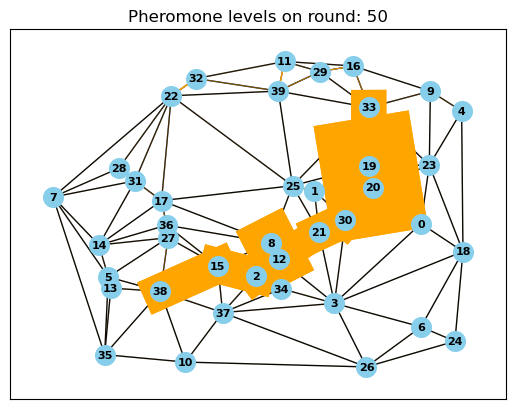

Shortest path round 50: 8.90704791217407


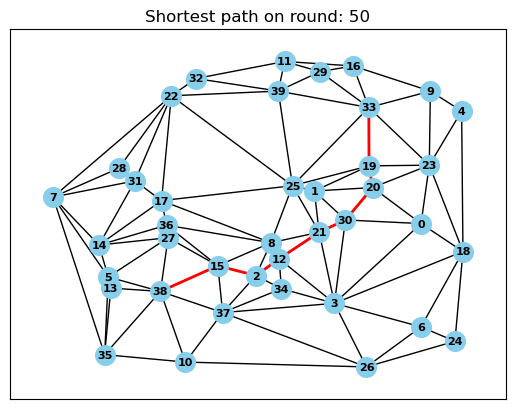

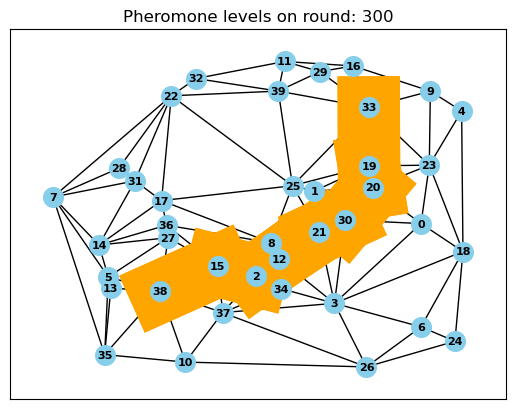

Shortest path round 300: 8.90704791217407


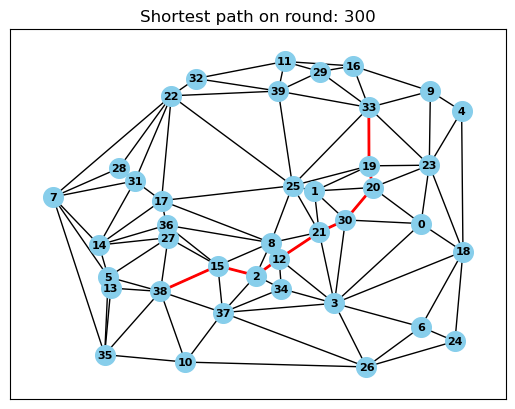

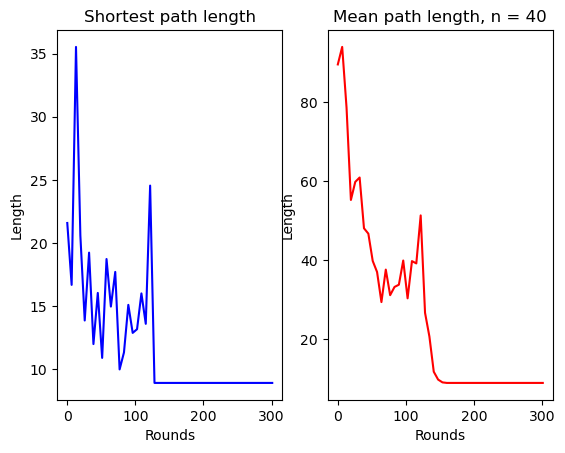

Simulation time:  0 minutes and 14 seconds


In [77]:
# Increased alpha, normal beta and decreased decay: Will hopefully maintain some exploring
mode = 'Load'
alpha = 2
beta = 1.0
decay = 0.1
st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=33, endPoint=38)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

Explores a lot in the beginning and discards several solution, finally settles on a good solution.

Part D) Increased number of ants.

In [80]:
def Initialization(n):
    if mode == 'Create':
        nodes = 10*np.random.uniform(0, 1, size=(n, 2))
        #nodes = np.random.rand(n, 2)
        connections = GenerateTopology(nodes)
        # Save data
        SaveData(nodes, 'nodes40d.csv')
        SaveData(connections, 'ConnectionMatrix40d.csv')
    else:
        # Load data
        nodes = LoadData('nodes40d.csv')
        connections = LoadData('ConnectionMatrix40d.csv')
    
    return nodes, connections


 Start point: 14
 End point: 20


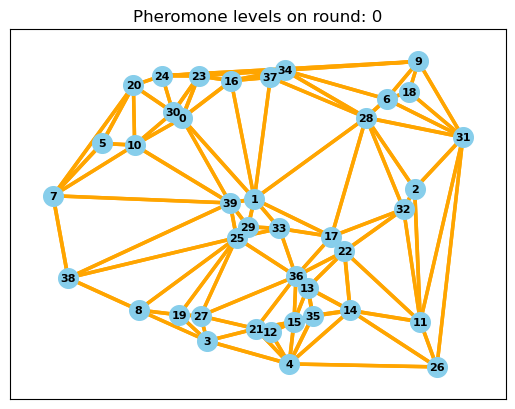

Shortest path round 0: 16.72492820058056


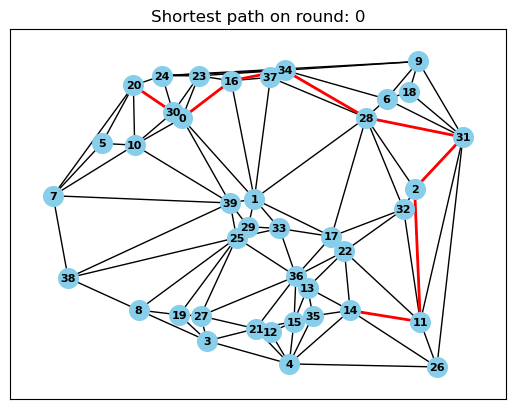

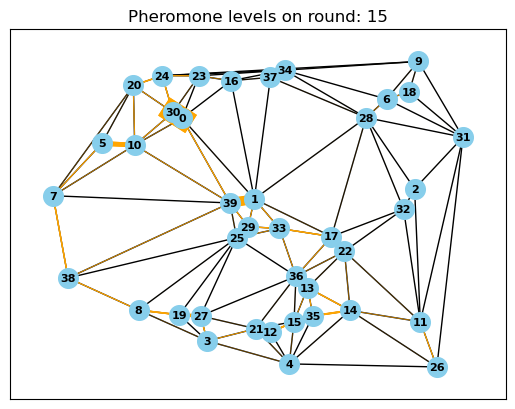

Shortest path round 15: 15.474807605051984


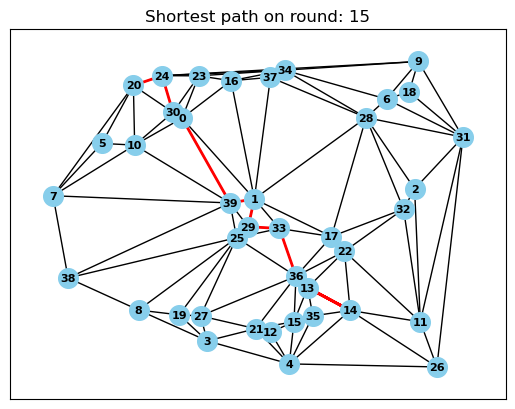

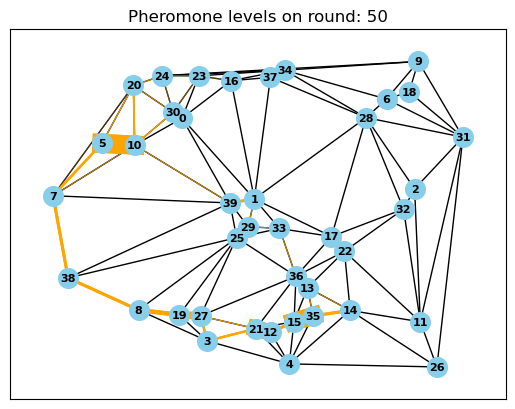

Shortest path round 50: 12.327844124370344


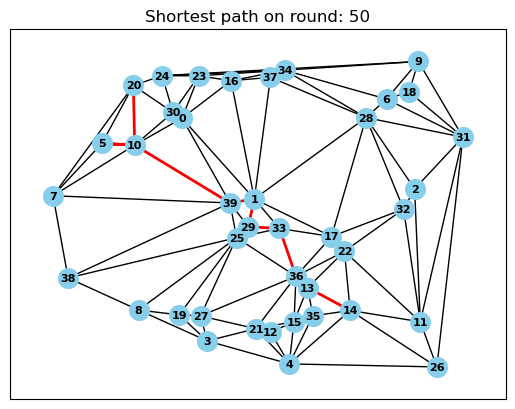

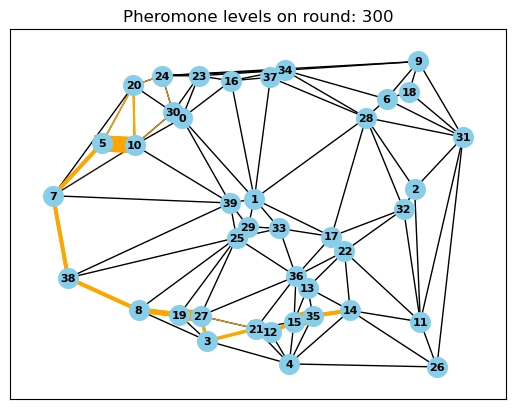

Shortest path round 300: 14.820494835452525


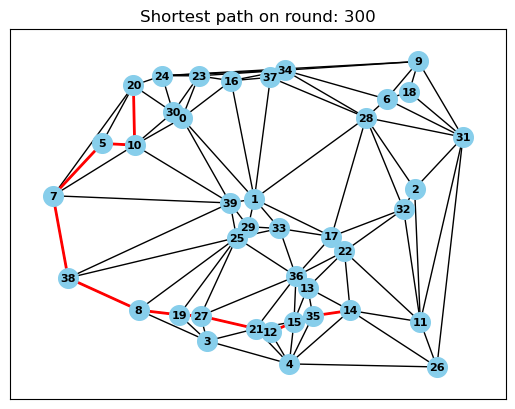

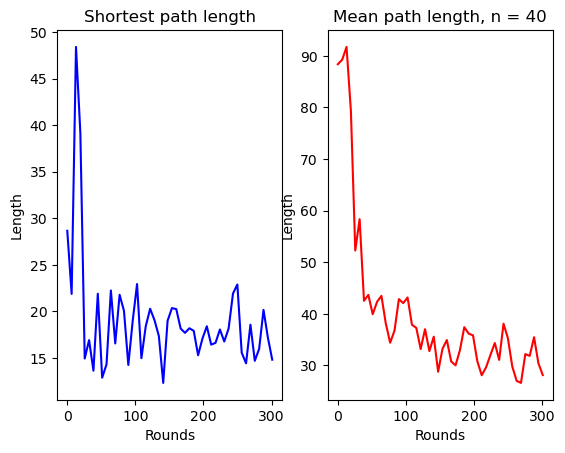

Simulation time:  0 minutes and 47 seconds


In [83]:
# Variables - Set baseline, choose a map and start and end points
mode = 'Load'
alpha = 0.8
beta = 1
decay = 0.5
R = 301
S = 120
nA = 20
Q = 1
n = 40
st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=14, endPoint=20)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')


 Start point: 14
 End point: 20


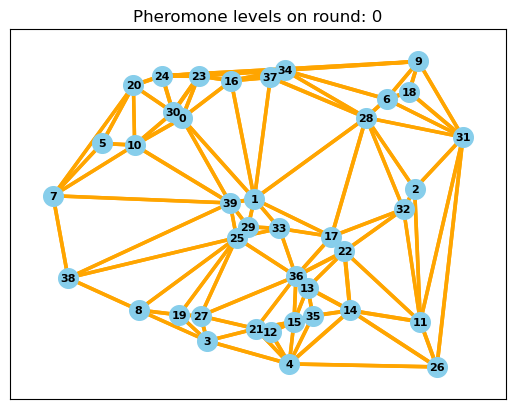

Shortest path round 0: 12.530133505730218


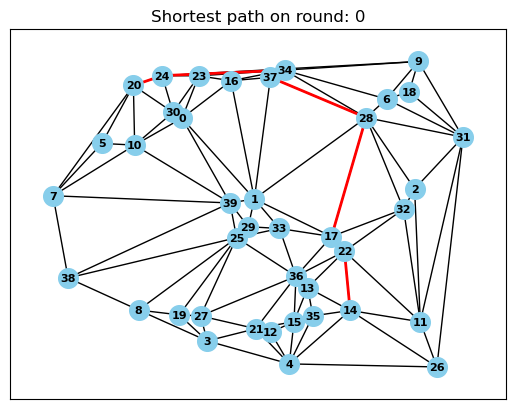

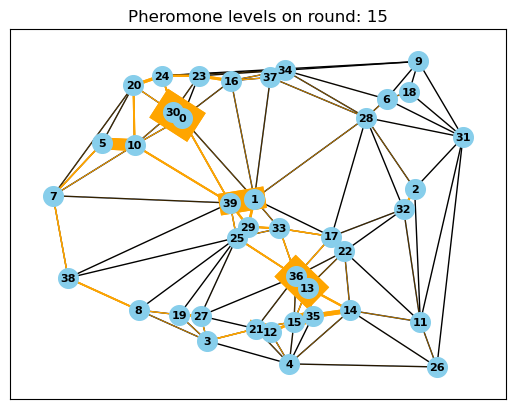

Shortest path round 15: 13.276952268015819


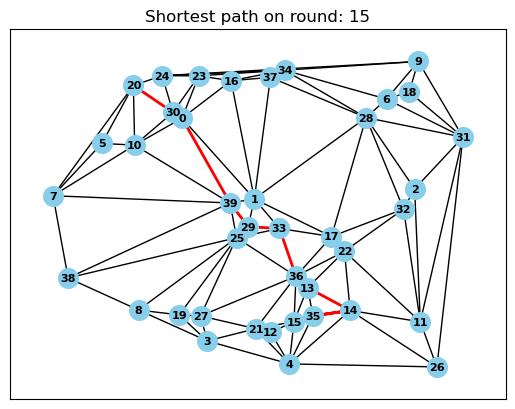

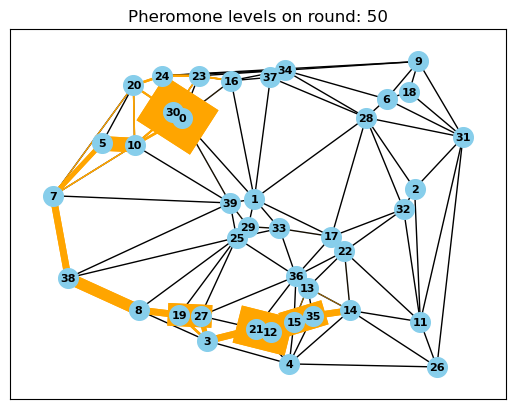

Shortest path round 50: 14.654276612942116


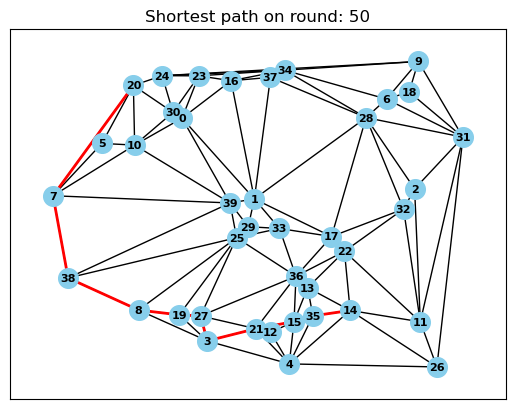

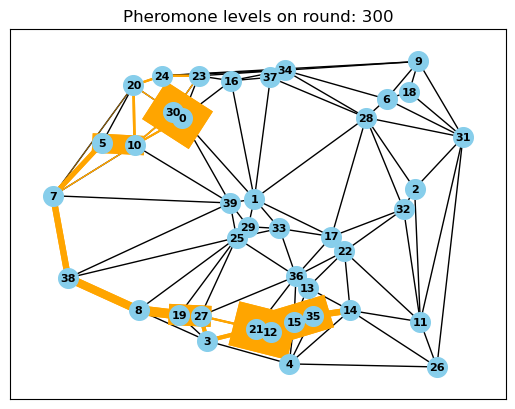

Shortest path round 300: 17.307279291253387


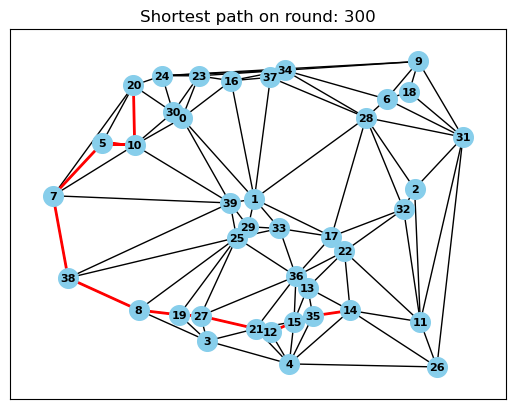

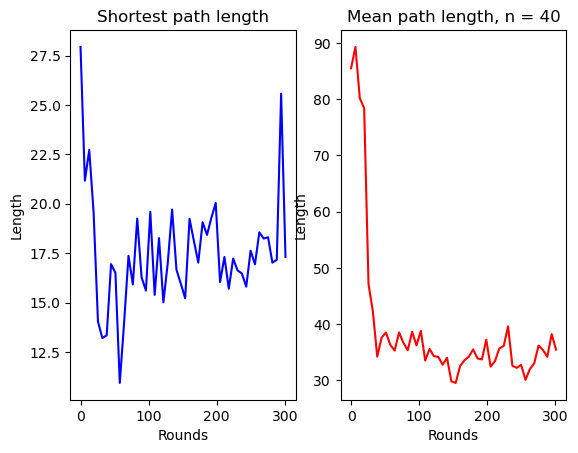

Simulation time:  1 minutes and 45 seconds


In [85]:
# Variables - Increase ants: 2x, same map
mode = 'Load'
nA = 20*2

st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=14, endPoint=20)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

Worse overall performance, to many options lead to discarding good paths and never settling on a good solution. More than double the computation time.


 Start point: 14
 End point: 20


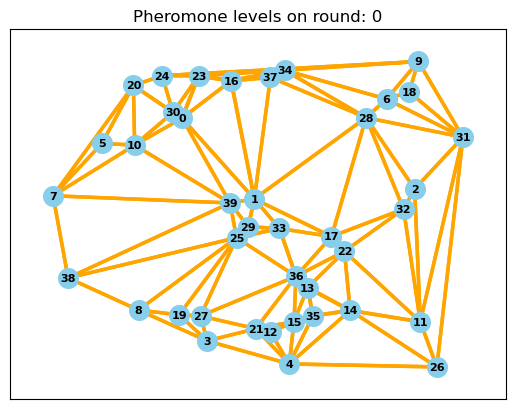

Shortest path round 0: 15.595548709867707


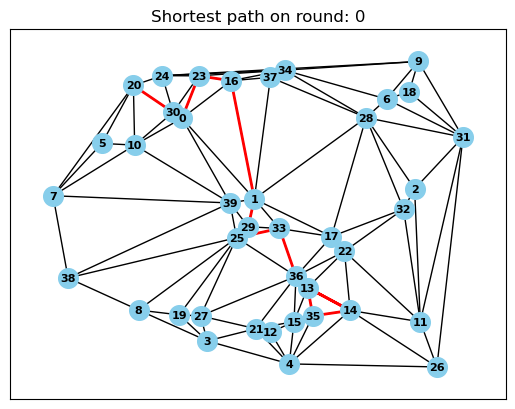

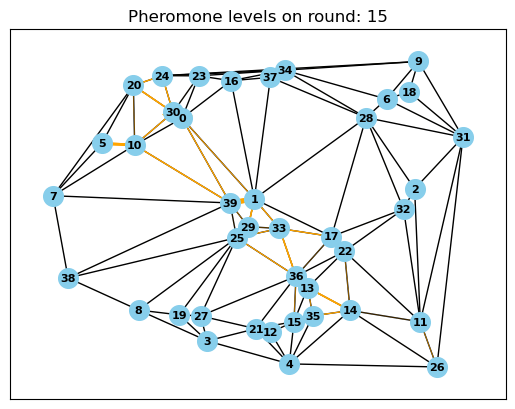

Shortest path round 15: 14.319826764248695


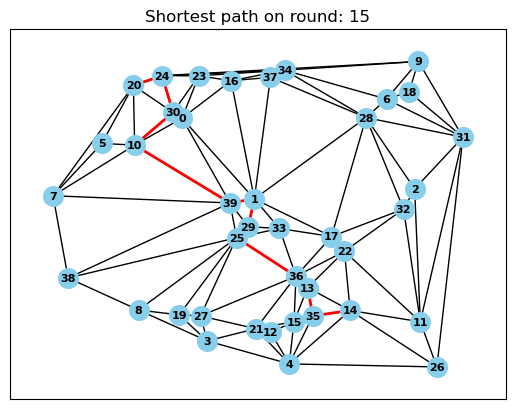

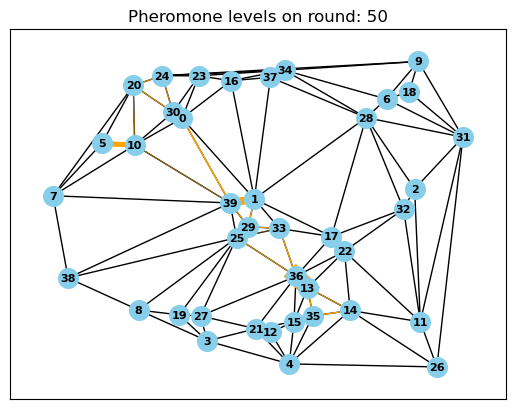

Shortest path round 50: 22.955378279802577


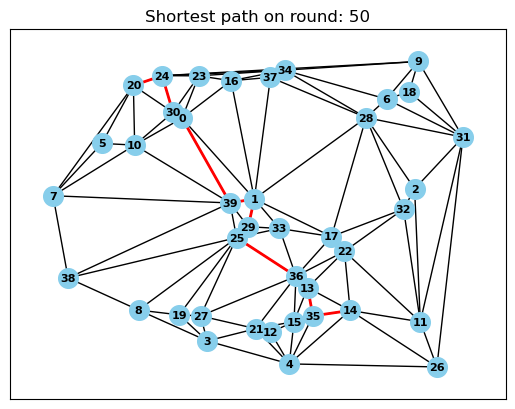

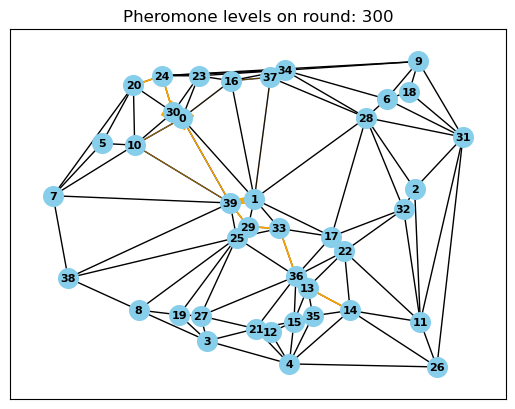

Shortest path round 300: 15.938331750532983


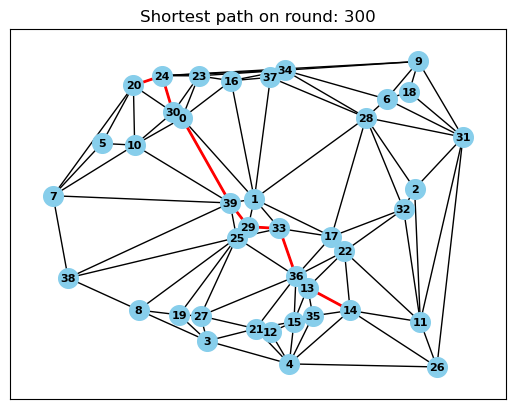

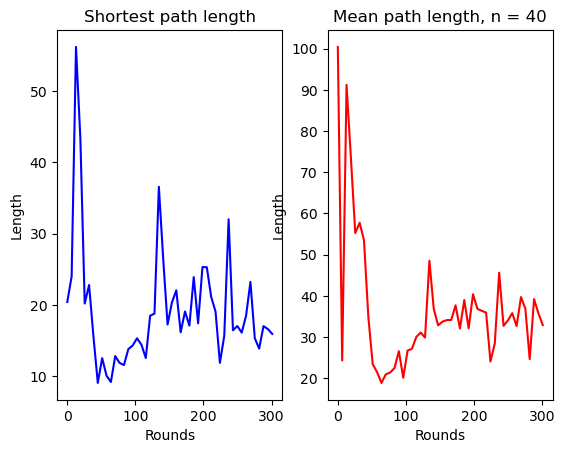

Simulation time:  0 minutes and 34 seconds


In [88]:
# Variables - Increase ants:0.5x, same map
mode = 'Load'
nA = 10

st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=14, endPoint=20)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

Depends more on the initial path, never settles. Half the computation time

The algorithm should try to have as little ants as possible and control exploration with other parameters. Increasing the number of ants is a costly way to do so. Increasing beta and reducing decay and possibly making those value change throughout the algorithm is a better and faster way to find a good solution.

15.9 Noisy square lattice

Modify initialization and topology functions

In [89]:
def GenerateLattice(n, noise):
    # Create perfect grid
    x = np.linspace(0,1, num=n)
    y = np.linspace(0,1, num=n)
    nodes = [[i, j] for i in x for j in y]

    # Introduce noise
    for i in range(n**2):
        nodes[i][0] += noise*np.random.uniform(-1, 1)
        nodes[i][1] += noise*np.random.uniform(-1, 1)

    # Create connections
    # Initialize connections to form squares
    connections = np.zeros(shape=(n**2, n**2))
    for i in range(len(connections)):
        if i % n == 0:
            # Left side
            if i // n == 0:
                # Top
                connections[i][i+1] = 1 # Right
                connections[i][i+n] = 1 # Below
            elif i // n == (n-1):
                # bottom
                connections[i][i+1] = 1 # Right
                connections[i][i-n] = 1 # Above
            else:
                # Middle
                connections[i][i+1] = 1 # Right
                connections[i][i+n] = 1 # Below
                connections[i][i-n] = 1 # Above
            
        elif i % n == (n-1):
            # Right side
            if i // n == 0:
                # Top
                connections[i][i-1] = 1 # Left
                connections[i][i+n] = 1 # Below
            elif i // n == (n-1):
                # bottom
                connections[i][i-1] = 1 # Left
                connections[i][i-n] = 1 # Above
            else:
                # Middle
                connections[i][i-1] = 1 # Left
                connections[i][i+n] = 1 # Below
                connections[i][i-n] = 1 # Above
        else:
            # Internally
            if i // n == 0:
                # Top
                connections[i][i+1] = 1 # Right
                connections[i][i-1] = 1 # Left
                connections[i][i+n] = 1 # Below
            elif i // n == (n-1):
                # bottom
                connections[i][i+1] = 1 # Right
                connections[i][i-1] = 1 # Left
                connections[i][i-n] = 1 # Above
            else:
                # Middle
                connections[i][i+1] = 1 # Right
                connections[i][i-1] = 1 # Left
                connections[i][i-n] = 1 # Above
                connections[i][i+n] = 1 # Below
                
    np.fill_diagonal(connections, 0)
    return nodes, connections

def Initialization(n, noise):
    if mode == 'Create':
        nodes, connections = GenerateLattice(n, noise)
        # Save data
        SaveData(nodes, 'nodesLattice.csv')
        SaveData(connections, 'ConnectionLattice.csv')
    else:
        # Load data
        nodes = LoadData('nodesLattice.csv')
        connections = LoadData('ConnectionLattice.csv')
    
    return nodes, connections

Larger changes to plotting functions

In [112]:
def PlotPath(nodes, path, start, end, step, dMatrix, adjacency):
    # Snippets stolen from last homework
    print(f'Shortest path round {step}: {PathLength(path, dMatrix)}')
    ## Plot all connections ##
    # Seperate coordinates
    x = [node[0] for node in nodes]
    y = [node[1] for node in nodes]

    # Find connections
    pairs = []
    pairCoord = []
    for i, connections in enumerate(adjacency):
        for j, connection in enumerate(connections):
            if connection == 1:
                pairs.append([i, j])
                pairCoord.append([[x[i], x[j]], [y[i], y[j]]])

    counter = 1
    for pair in pairCoord:
        counter += 1
        plt.plot(pair[0], pair[1], linewidth=0.1, color='blue')

    plt.xticks([]), plt.yticks([])
    ## Plot path ##
    x = [node[0] for node in nodes]
    y = [node[1] for node in nodes]
    xPath = [x[edge] for edge in path]
    yPath = [y[edge] for edge in path]
    plt.plot(xPath, yPath, linewidth=2, color='red')
    plt.scatter(x, y, color='orange')
    plt.title(f'Shortest path on round: {step}')

    plt.show()

def PlotPheromone(nodes, connections, pMatrix, step):
    n = len(nodes)
    # Modify connection lines based on pheromone levels
    x = [node[0] for node in nodes]
    y = [node[1] for node in nodes]

    for i in range(n):
        for j in range(n):
            if connections[i][j] == 1:
                pLevel = pMatrix[i][j] + pMatrix[j][i]
                color = 'black' if pLevel < (1/(10**5)) else 'orange'
                if step == 0:
                    linewidth = 2.5*pLevel
                else:
                    linewidth = 0.5+0.5*pLevel
                if pLevel < (1/(10**5)):
                    linewidth = 1
                plt.plot([x[i], x[j]], [y[i], y[j]], color=color, linewidth=linewidth)

    plt.scatter(x, y)
    plt.title(f'Pheromone levels on round: {step}')
    plt.show()

Few changes to algorithm

In [113]:
def RunAlgorithm(r, s, nAnts, n, savePoints, startPoint=-1, endPoint=-1):
    # Initialize grid and matrices
    nodes, connections = Initialization(n, noise)
    dMatrix, weights = DistanceMatrix(nodes, connections)
    pMatrix = np.copy(connections) # Pheromone levels initialized to 1 where connections exist
    nodeList = np.linspace(0, n**2 -1, num=n**2, dtype=int)

    # Set start and stop points:
    if startPoint == -1:
        start = np.random.randint(0, n-1)
    else:
        start = startPoint
    if endPoint == -1:
        end = np.random.randint(0, n-1)
        while start == end:
            end = np.random.randint(0, n-1)
    else:
        end = endPoint

    print(f'\n Start point: {start}\n End point: {end}')

    # Set up data save for later plotting
    sPath = []
    sPathLength = []
    mPathLength = []

    for round in range(r):
        # Generate ant paths, all at the same start point
        antPaths = [[start] for i in range(nAnts)]
        for step in range(s):
            for ant in range(nAnts):
                if antPaths[ant][-1] != end: # Only take step if end is not reached
                    antPaths[ant].append(TakeStep(nodeList, connections, antPaths[ant][-1], weights, pMatrix))
        
        # Simplify paths and calculate length of finished paths
        pLength = []
        fPaths = []
        for ant in range(nAnts):
            if antPaths[ant][-1] == end:
                fPaths.append(SimplifyPath(antPaths[ant])) # Save finished paths seperately
                pLength.append(PathLength(antPaths[ant], dMatrix))
        
        # Update pheromone levels, only finished paths influence
        pMatrix = UpdatePheromone(pMatrix, fPaths, pLength, end, connections)

        if round < 20:
            idx = np.argmin(pLength)
            sPathLength.append(np.copy(pLength[idx]))
            mPathLength.append(np.mean(pLength))
        elif round % 10 == 0 and round > 20:
            idx = np.argmin(pLength)
            sPathLength.append(np.copy(pLength[idx]))
            mPathLength.append(np.mean(pLength))

        if round in savePoints:
            idx = np.argmin(pLength)
            PlotPheromone(nodes, connections, pMatrix, round)
            PlotPath(nodes, fPaths[idx], start, end, round, dMatrix, connections)
            sPath.append(fPaths[idx])
    PlotLength(r, sPathLength, mPathLength)

In [115]:
# Variables, same as 15.7, n reduced to 10 which still results in 100 nodes
mode = 'Create'
alpha = 0.8
beta = 1
decay = 0.5
R = 301
S = 120
nA = 20
Q = 1
n = 10

Part a) Noisy lattice


 Start point: 0
 End point: 99


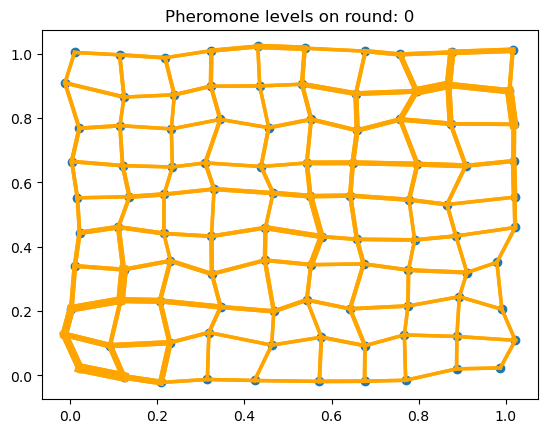

Shortest path round 0: 3.404771579188785


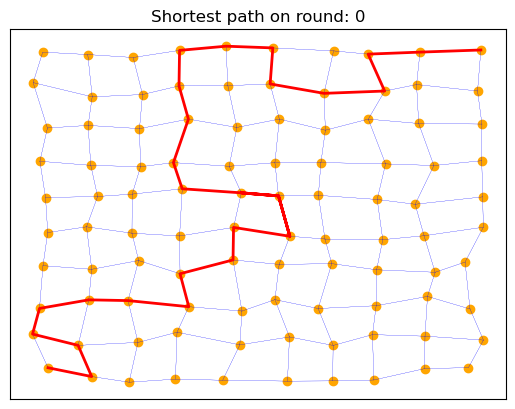

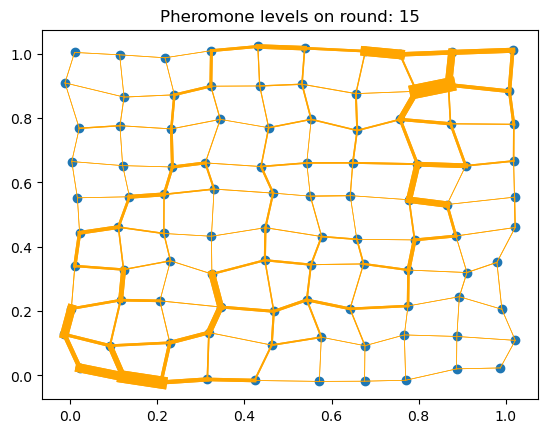

Shortest path round 15: 2.308367914808363


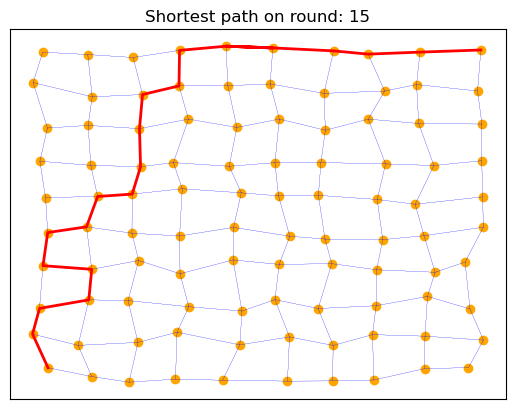

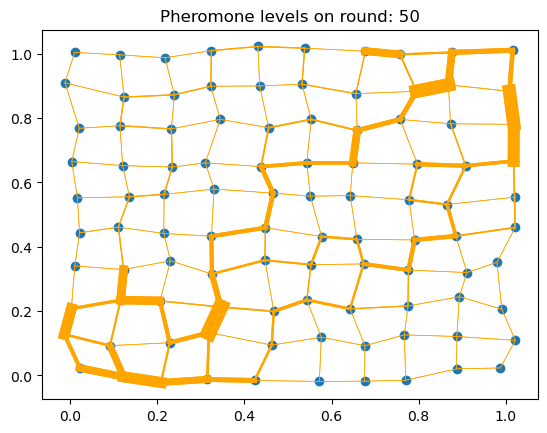

Shortest path round 50: 2.0588371201139335


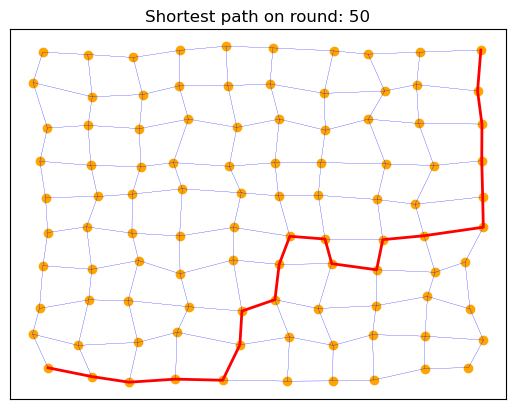

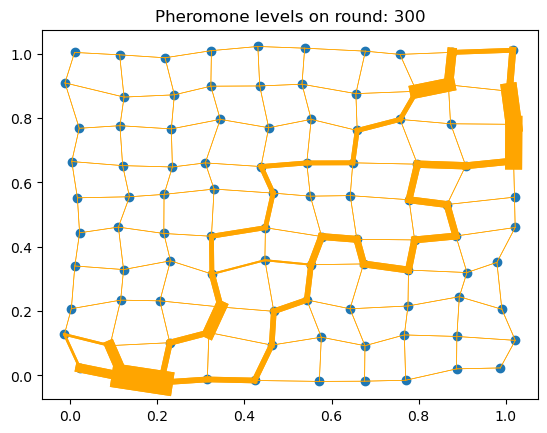

Shortest path round 300: 2.037572341877227


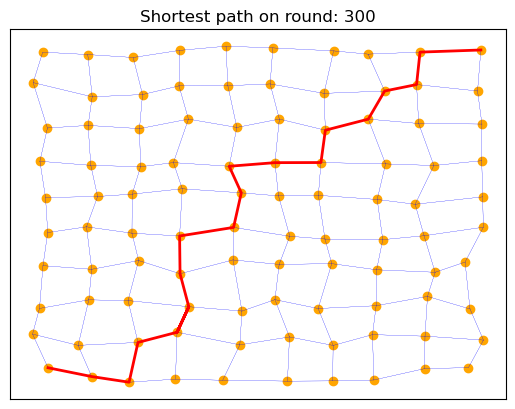

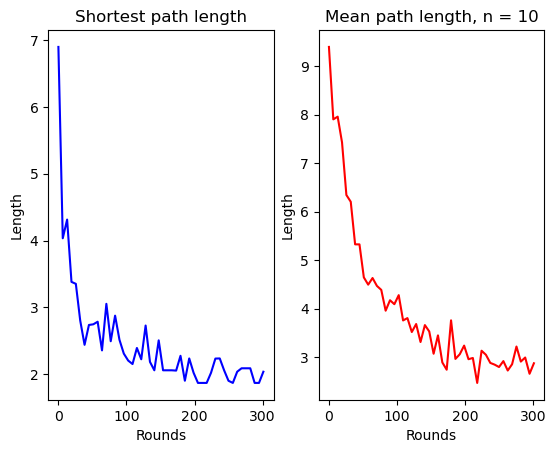

Simulation time:  1 minutes and 37 seconds


In [116]:
# Noisy lattice
noise = 0.025
st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=0, endPoint=99)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

Part b) By increasing beta to prioritise shorter connections in the beginning of the simulation and gradually decrease it should find a shorter path.

Part c) Perfect lattice


 Start point: 0
 End point: 99


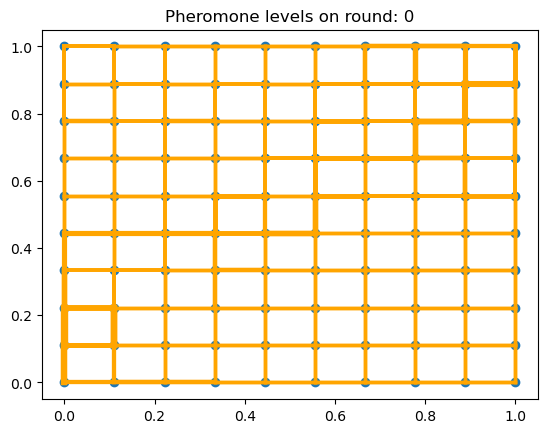

Shortest path round 0: 2.444444444444445


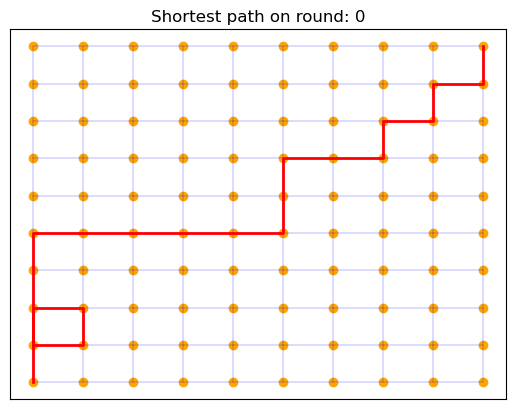

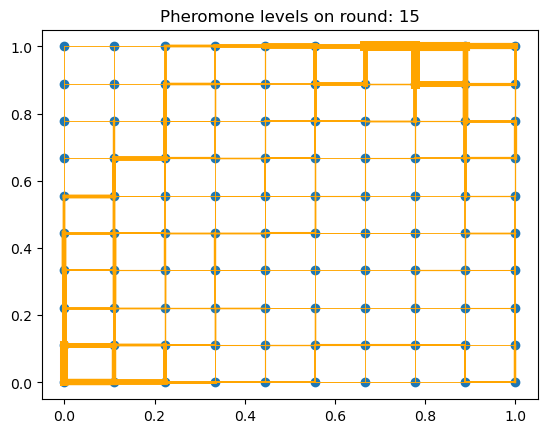

Shortest path round 15: 2.444444444444445


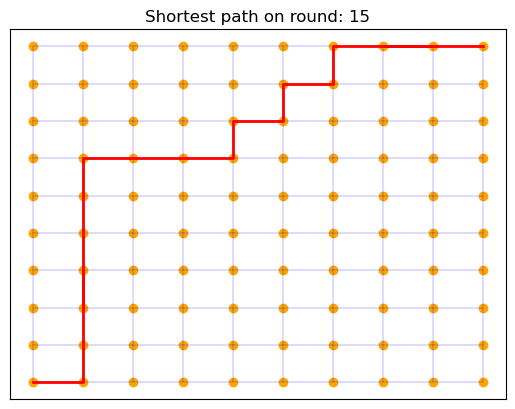

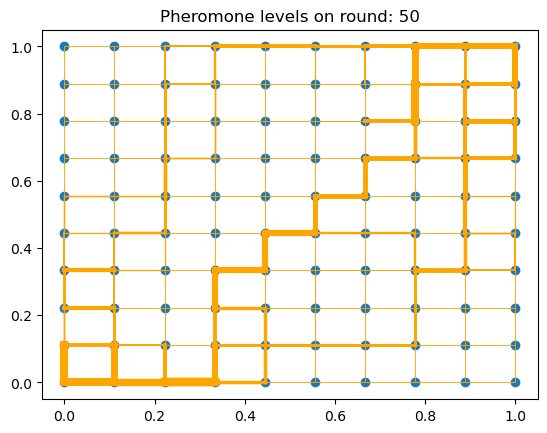

Shortest path round 50: 2.2222222222222228


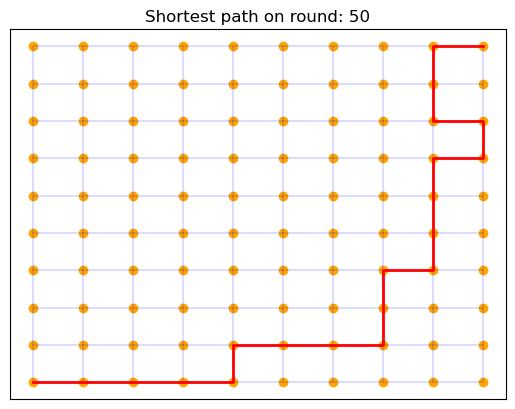

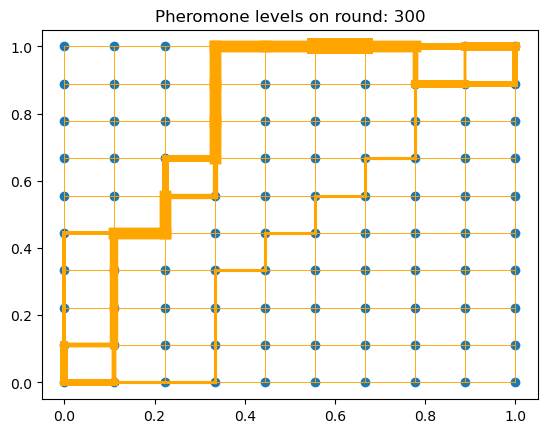

Shortest path round 300: 2.0000000000000004


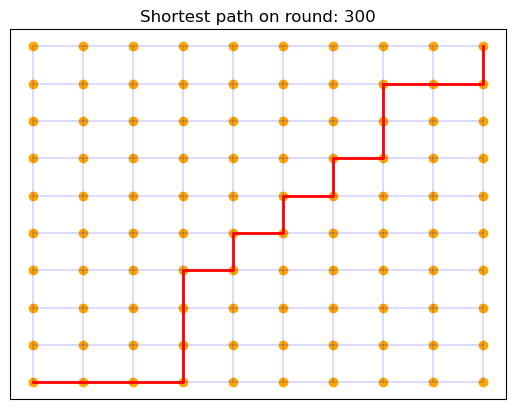

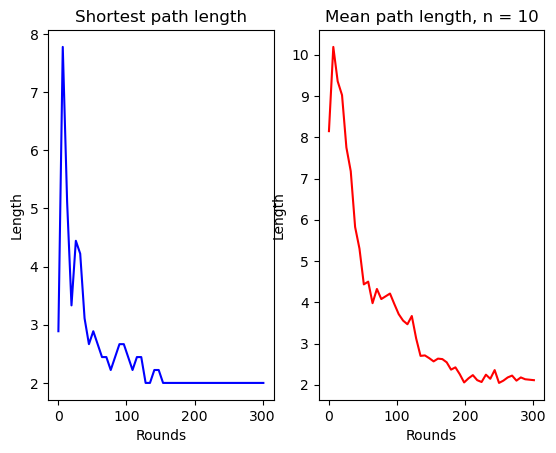

Simulation time:  1 minutes and 11 seconds


In [117]:
# Perfect lattice
noise = 0.
st = time.time()
RunAlgorithm(R, S, nA, n, [0, 15, 50, 300], startPoint=0, endPoint=99)
print(f'Simulation time: {(time.time()-st)//60:2.0f} minutes and {(time.time()-st)%60:2.0f} seconds')

Path choice is arbitrary between runs and it is takes a while to settle on a single path because pheromone levels have to decrease enough to not lead it to detours.